# A Bayesian Model for the Giant Flare Pulse Fraction

We are building a model for the pulse fraction of the giant flare, based on a spline representation of the data.
This is a bit clunky, but we have nothing better, so we'll stick for this for now.

This is a cleaner version of code already in the other notebook.

In [1]:
# plotting imports
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# standard library imports
import copy

# numpy and scipy imports
import numpy as np
import scipy.interpolate

# stingray imports
from stingray import Lightcurve, Powerspectrum

# other packages
import emcee
import corner

First, load the data. It is in eight text files, one for each energy bin. 

In [2]:
datadir = "../data/"

Here's the source and background photons:

In [3]:
tot = np.loadtxt(datadir+"sc_TOA_ENERGY.txt")
bkg = np.loadtxt(datadir+"bg_TOA_ENERGY.txt")

We want to extract the light curves in four energy bins:

1. 0 - 40 keV
2. 40 - 80 keV
3. 80 - 250 keV
4. 250 - 16000 keV

In [4]:
toa1 = tot[(tot[:,1] < 40.0) & (tot[:,1] > 25.0)]
toa2 = tot[(tot[:,1] < 80.0) & (tot[:,1] > 40.0)]
toa3 = tot[(tot[:,1] < 250.0) & (tot[:,1] > 80.0)]
toa4 = tot[(tot[:,1] < 16000.0) & (tot[:,1] > 250.0)]

tot1 = len(toa1)
tot2 = len(toa2)
tot3 = len(toa3)
tot4 = len(toa4)

bkg1 = len(bkg[(bkg[:,1] < 40.0) & (bkg[:,1] > 25.0)])
bkg2 = len(bkg[(bkg[:,1] < 80.0) & (bkg[:,1] > 40.0)])
bkg3 = len(bkg[(bkg[:,1] < 250.0) & (bkg[:,1] > 80.0)])
bkg4 = len(bkg[(bkg[:,1] < 16000.0) & (bkg[:,1] > 250.0)])

We will need to multiply the background by a constant factor, because we only have ~26s before the burst to estimate the background, but our segment is 90 seconds long:

In [5]:
tseg_burst = tot[-1,0] - tot[0,0]
tseg_bkg = bkg[-1,0] - bkg[0,0]
print("The duration of the burst segment is " + str(tseg_burst))
print("The duration of the background segment is " + str(tseg_bkg))

bkg_fac = tseg_burst/tseg_bkg
print("The multiplicative factor for the background is " + str(bkg_fac))

tot_counts = np.array([tot1, tot2, tot3, tot4])
bkg_counts = np.array([bkg1, bkg2, bkg3, bkg4])*bkg_fac

counts = tot_counts - bkg_counts



The duration of the burst segment is 89.9999341964
The duration of the background segment is 25.6382160187
The multiplicative factor for the background is 3.51038208473


In [6]:
energies = np.array([20.0, 60.0, 165.0, 8125.0])

We're later on also going to need the number of data sets used. Here, it is 4:

In [7]:
npsd = len(energies)

We're going to use binned light curves, since we don't care about anything above 10 Hz:

In [8]:
dt = 0.5/10.0
tstart_burst = tot[0,0]

lc1 = Lightcurve.make_lightcurve(toa1[:,0], dt=dt, 
                                 tstart=tstart_burst, 
                                 tseg=tseg_burst)

lc2 = Lightcurve.make_lightcurve(toa2[:,0], dt=dt,
                                 tstart=tstart_burst, 
                                 tseg=tseg_burst)

lc3 = Lightcurve.make_lightcurve(toa3[:,0], dt=dt,
                                 tstart=tstart_burst, 
                                 tseg=tseg_burst)

lc4 = Lightcurve.make_lightcurve(toa4[:,0], dt=dt,
                                 tstart=tstart_burst, 
                                 tseg=tseg_burst)

lc_all = [lc1, lc2, lc3, lc4]

In [9]:
for lc, tot, src, bkg in zip(lc_all, tot_counts, counts,bkg_counts):
    print("sum(lc.counts): " + str(np.sum(lc.counts)))
    print("all counts: " + str(tot))
    print("src counts: " + str(src))
    print("bkg counts: " + str(bkg))
    print("total counts : " + str(src+bkg) + "\n")

sum(lc.counts): 134188
all counts: 134342
src counts: 122536.585049
bkg counts: 11805.4149509
total counts : 134342.0

sum(lc.counts): 330463
all counts: 330805
src counts: 287939.724363
bkg counts: 42865.2756366
total counts : 330805.0

sum(lc.counts): 130474
all counts: 130561
src counts: 57822.3728224
bkg counts: 72738.6271776
total counts : 130561.0

sum(lc.counts): 97858
all counts: 97899
src counts: 7222.32036942
bkg counts: 90676.6796306
total counts : 97899.0



Now we can make the power spectra:

In [10]:
ps1 = Powerspectrum(lc1, norm="leahy")
ps2 = Powerspectrum(lc2, norm="leahy")
ps3 = Powerspectrum(lc3, norm="leahy")
ps4 = Powerspectrum(lc4, norm="leahy")

Let's make a function for this, so it'll be easier in the future:

In [11]:
def load_rhessi_data(datadir, dt=0.5/10.0):
    """
    Load the RHESSI data for the SGR 1806-20 giant flare
    Note that the data *must* be exactly the data files in this repo in order to 
    work. Modify this function according to your needs for other data files.
    
    Parameters
    ----------
    datadir : str
        Path to the data directory
        
    dt : float
        Time resolution for the light curves
    
    Returns
    -------
    lc_all : iterable of Lightcurve objects
        A list with the light curves in all four energy bins
        
    ps_all : iterable of Powerspectrum objects
        A list with the power spectra of the light curves in `lc_all`
    """
    
    tot = np.loadtxt(datadir+"sc_TOA_ENERGY.txt")
    bkg = np.loadtxt(datadir+"bg_TOA_ENERGY.txt")
    
    toa1 = tot[(tot[:,1] < 40.0) & (tot[:,1] > 25.0)]
    toa2 = tot[(tot[:,1] < 80.0) & (tot[:,1] > 40.0)]
    toa3 = tot[(tot[:,1] < 250.0) & (tot[:,1] > 80.0)]
    toa4 = tot[(tot[:,1] < 16000.0) & (tot[:,1] > 250.0)]

    tot1 = len(toa1)
    tot2 = len(toa2)
    tot3 = len(toa3)
    tot4 = len(toa4)

    bkg1 = len(bkg[(bkg[:,1] < 40.0) & (bkg[:,1] > 25.0)])
    bkg2 = len(bkg[(bkg[:,1] < 80.0) & (bkg[:,1] > 40.0)])
    bkg3 = len(bkg[(bkg[:,1] < 250.0) & (bkg[:,1] > 80.0)])
    bkg4 = len(bkg[(bkg[:,1] < 16000.0) & (bkg[:,1] > 250.0)])
    
    tseg_burst = tot[-1,0] - tot[0,0]
    tseg_bkg = bkg[-1,0] - bkg[0,0]
    print("The duration of the burst segment is " + str(tseg_burst))
    print("The duration of the background segment is " + str(tseg_bkg))

    bkg_fac = tseg_burst/tseg_bkg
    print("The multiplicative factor for the background is " + str(bkg_fac))

    tot_counts = np.array([tot1, tot2, tot3, tot4])
    bkg_counts = np.array([bkg1, bkg2, bkg3, bkg4])*bkg_fac

    counts = tot_counts - bkg_counts

    energies = np.array([20.0, 60.0, 165.0, 8125.0])
    npsd = len(energies)

    dt = 0.5/10.0

    lc1 = Lightcurve.make_lightcurve(toa1[:,0], dt=dt)
    lc2 = Lightcurve.make_lightcurve(toa2[:,0], dt=dt)
    lc3 = Lightcurve.make_lightcurve(toa3[:,0], dt=dt)
    lc4 = Lightcurve.make_lightcurve(toa4[:,0], dt=dt)
    
    ps1 = Powerspectrum(lc1, norm="leahy")
    ps2 = Powerspectrum(lc2, norm="leahy")
    ps3 = Powerspectrum(lc3, norm="leahy")
    ps4 = Powerspectrum(lc4, norm="leahy")
    
    lc_all = [lc1, lc2, lc3, lc4]
    ps_all = [ps1, ps2, ps3, ps4]
    
    return lc_all, ps_all, counts, bkg_counts, energies, npsd

In [12]:
lc_all, ps_all, counts, bkg_counts, energies, npsd = load_rhessi_data("../data/")

The duration of the burst segment is 89.9999341964
The duration of the background segment is 25.6382160187
The multiplicative factor for the background is 3.51038208473


## Constructing a pulse profile template 

We're going to use a coarse version of the original light curve as a template for the other energy bins. For this, we'll use the second energy bin (40-80 keV), which is the brightest fo the bins, and rebin that light curve to a new (coarse) time resolution, which will then be input into a spline interpolation:

In [17]:
# light curve to use as a template
lc2 = lc_all[2]

# time resolution in seconds of the new light curve
new_res = 0.5

lc2_bin = lc2.rebin_lightcurve(new_res)

Let's plot the result:

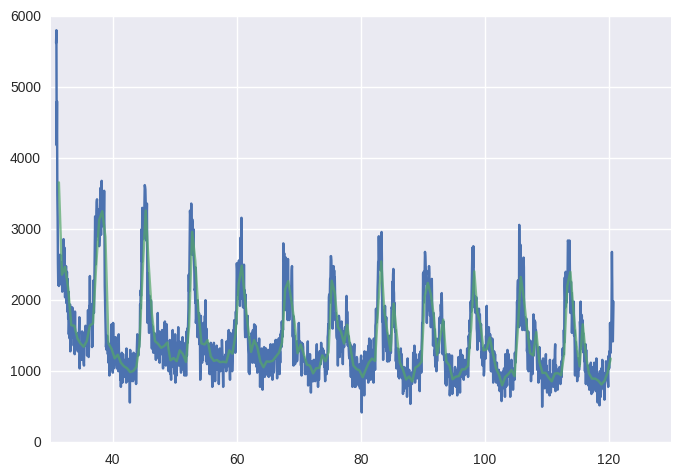

In [18]:
plt.figure()
plt.plot(lc2.time, lc2.countrate)
plt.plot(lc2_bin.time, lc2_bin.countrate, alpha=0.7)

Now we can do the cubic spline interpolation:

In [19]:
f = scipy.interpolate.interp1d(lc2_bin.time, lc2_bin.countrate, kind="cubic")

Now we're going to copy the original light curve into a new `Lightcurve` object, which will store the template:

In [20]:
# copy of original light curve
lc2_smooth = copy.copy(lc2)

# this light curve must be shorter, because the spline interpolation
# only works for data points within the first and last data point 
# of the binned light curve. Any of the original time stamps before 
# and after are lost.
min_ind = lc2_smooth.time.searchsorted(lc2_bin.time[0])
max_ind = lc2_smooth.time.searchsorted(lc2_bin.time[-1])

lc2_smooth.time = lc2_smooth.time[min_ind:max_ind]
lc2_smooth.counts = lc2_smooth.counts[min_ind:max_ind]
lc2_smooth.countrate = lc2_smooth.countrate[min_ind:max_ind]
lc2_smooth.n = len(lc2_smooth.time)

We're also going to make short versions of the light curves we already have, so that our data light curves have the same time stamps as the interpolated model:

In [21]:
lc_short = []
ps_short = []

for lc in lc_all:
    lcs = copy.deepcopy(lc)
    lcs.time = lcs.time[min_ind:max_ind]
    lcs.counts = lcs.counts[min_ind:max_ind]
    lcs.countrate = lcs.countrate[min_ind:max_ind]
    lcs.nn = len(lcs.time)
    lc_short.append(lcs)
    ps_short.append(Powerspectrum(lcs, norm="leahy"))


Now we can use the interpolated version of the light curve and assign it as the new `countrate` array:

In [22]:
lc2_smooth.countrate = f(lc2_smooth.time)
lc2_smooth.counts = lc2_smooth.countrate*lc2.dt

In order to make re-scaled model light curves, we need the estimated number of photons in the total source spectrum as well as the background spectrum. In practice, the emission we see is partly from the source, and partly from the sky background.

We have extracted these from the data as well (a hack!), they're in the arrays `counts` and `bkg_counts`


**Note**: We're currently using the values above, not the intrinsic total number of photons in each light curve. Not sure this will be correct, but we will see. First, we need to subtract the background from the pulse profile.

(We also want to re-scale the flux to the total number of photons in each energy bin. So we're going to re-scale the template such that it integrates to 1, i.e. divide by the total number of photons:)

In [23]:
bkg_countrate = bkg_counts/tseg_burst

In [24]:
lc2_smooth.counts -= bkg_countrate[2]*lc2_smooth.dt

In [25]:
lc2_smooth.counts /= (np.sum(lc_short[2].counts)-bkg_counts[2])
lc2_smooth.countrate /= np.sum(lc_short[2].counts)

Let's make some model light curves and power spectra:

In [26]:
lc_sim = []
for lc, src, bkg in zip(lc_short, counts, bkg_counts):
    # copy the original light curve
    lcs = copy.deepcopy(lc2_smooth)
        # re-normalize template to correct energy bin
    lcs.counts = (lcs.counts*src + bkg/lcs.n)
    lcs.countrate = lcs.counts/lcs.dt
    
    lc_sim.append(lcs)
    

In [27]:
for lc, lcs in zip(lc_short, lc_sim):
    print(np.sum(lc.counts))
    print(np.sum(lcs.counts))

130940
137262.194487
321542
337666.95062
127870
131938.976825
96719
98071.1165978


Let's plot the light curves and the models:

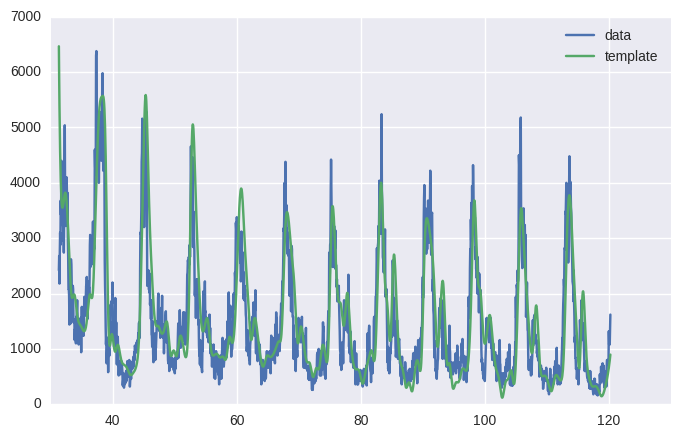

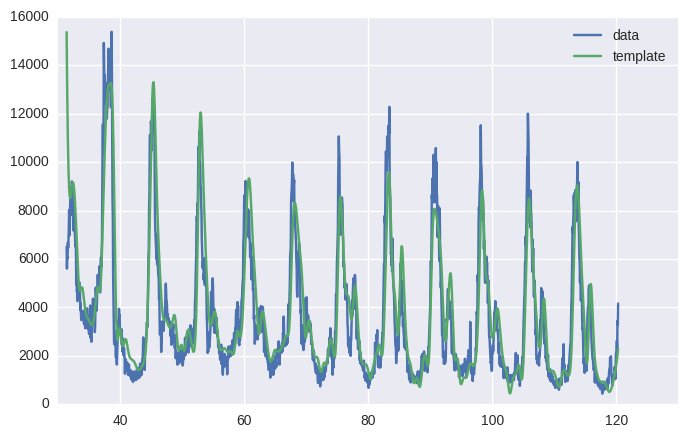

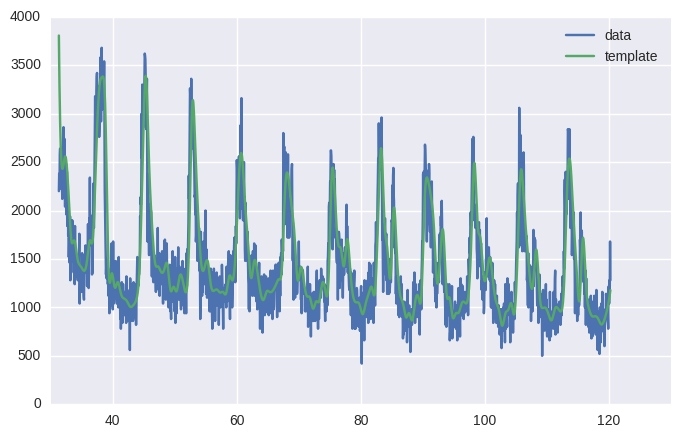

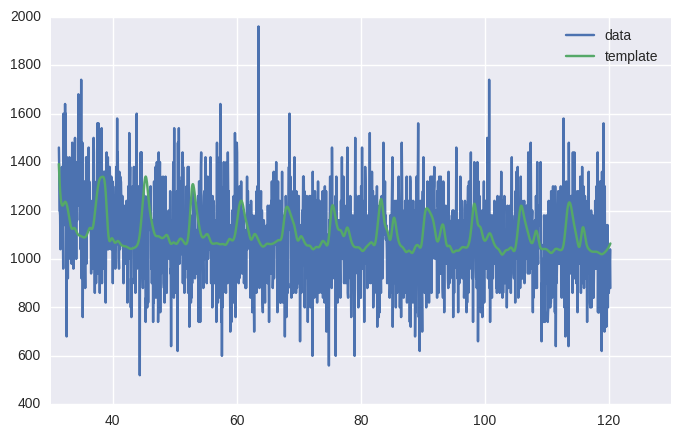

In [28]:
for lc, lcs in zip(lc_short, lc_sim):
    plt.figure(figsize=(8,5))
    plt.plot(lc.time, lc.countrate, label="data")
    plt.plot(lcs.time, lcs.countrate, label="template")
    plt.legend()

Let's have a look at the PSDs:

In [29]:
ps_sim = []

for lc in lc_sim:
    ps_sim.append(Powerspectrum(lc, norm="leahy"))


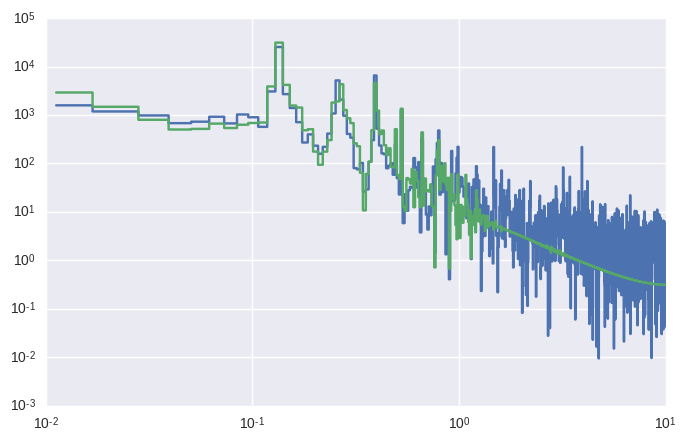

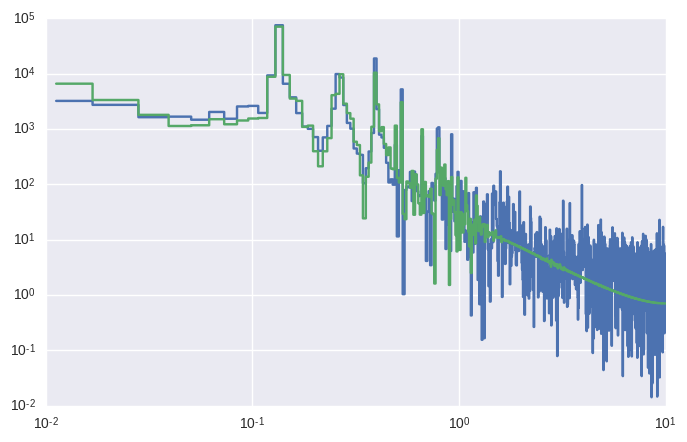

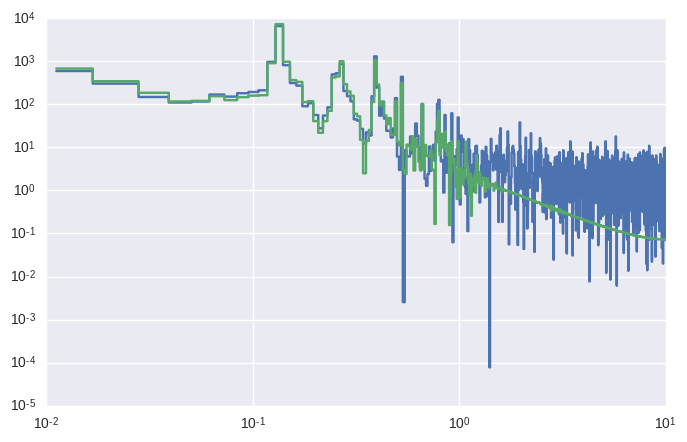

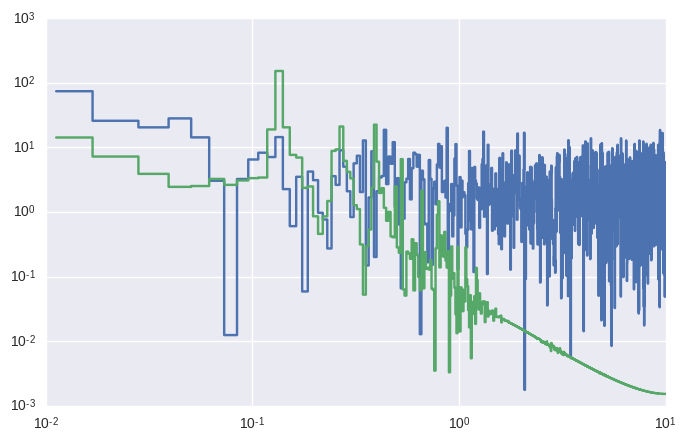

In [30]:
for ps, pss in zip(ps_short, ps_sim):
    plt.figure(figsize=(8,5))
    plt.loglog(ps.freq, ps.power, linestyle="steps-mid")
    plt.loglog(pss.freq, pss.power, linestyle="steps-mid")

Let's re-write the template function as above:

In [31]:
def make_template(lc, bkg, new_res=0.1):
    """
    Make a template using a spline interpolation of 
    a Lightcurve object.
    
    Parameters
    ----------
    lc : stingray.Lightcurve object
        A light curve to use to make the template
        
    bkg : float
        The background counts in the lightcurve object `lc`
                
    newres : float
        The time resolution for the binned light curve 
        to be used for interpolation. 
        Note: `newres` *must be* larger than `lc.dt`, i.e. 
        the new time resolution must be coarser than the old one.
        We cannot presently oversample the light curve, and that 
        wouldn't make any sense in this context, anyway
        
    Returns
    -------
    lc_template : stingray.Lightcurve object
        A Lightcurve object with the smoothed, interpolated 
        light curve template.
    
    """
    lc_bin = lc.rebin_lightcurve(new_res)
    f = scipy.interpolate.interp1d(lc_bin.time, 
                                   lc_bin.countrate, 
                                   kind="cubic")
    # copy of original light curve
    lc_template = copy.copy(lc)

    # this light curve must be shorter, because the spline interpolation
    # only works for data points within the first and last data point 
    # of the binned light curve. Any of the original time stamps before 
    # and after are lost.
    min_ind = lc_template.time.searchsorted(lc_bin.time[0])
    max_ind = lc_template.time.searchsorted(lc_bin.time[-1])

    lc_template.time = lc_template.time[min_ind:max_ind]
    lc_template.counts = lc_template.counts[min_ind:max_ind]
    lc_template.countrate = lc_template.countrate[min_ind:max_ind]
    lc_template.n = len(lc_template.time)
    
    lc_template.countrate = f(lc_template.time)
    lc_template.counts = lc_template.countrate*lc.dt
    
    # compute the background count *rate*
    bkg_cr = bkg/lc.tseg
    # short counts array for corrent normalization of the 
    # template
    short_counts = np.sum(lc.counts[min_ind:max_ind])


    lc_template.counts -= bkg_cr*lc_template.dt
    
    lc_template.counts /= (short_counts - bkg)
    lc_template.countrate /= (short_counts - bkg)
    
    return lc_template
    

Now we can also reproduce the model for all four energy bins. We're also including a power law component to take care of all the variability that the pulse profile template can't account for:

In [32]:
def pl_const(freq, idx, amp, c):
    return amp*freq**(-idx) + c

In [33]:
def model_psd(lc_all, lc_smooth, counts, bkg_counts, amplitudes, white_noise, 
              pl_indices, pl_amplitudes, norm="leahy"):
    """
    Model the set of power spectra from the SGR 1806-20 giant flare.
    
    Parameters
    ----------
        
    lc_all : iterable of stingray.Lightcurve objects
        The list of light curves from the data
        
    lc_smooth: stingray.Lightcurve object
        Smoothed light curve object to be used as a template
        
    counts : iterable
        The number of total *source* counts in each energy bin (background-subtracted)
        
    bkg_counts : iterable
        The number of total *background* counts in each energy bin
        
    amplitudes : iterable
        Additional multiplicative factors for the pulse profile in each energy bin 
        
    white_noise : iterable
        The white noise level for each power spectrum
        
    pl_indices: iterable
        The indices for the power law (red noise) component
        
    pl_amplitudes : iterable
        The amplitudes for the power law (red noise) component
        
    norm : str
        Any of the `stingray.Powerspectrum` normalizations
        
    Returns
    -------
    ps_all : iterable of stingray.Powerspectrum objects
        The list of model power spectra, one for each energy bin

    """
    
    lc_sim, ps_sim = [], []
    for i,(lc, a, src, bkg) in enumerate(zip(lc_all, 
                                             amplitudes, 
                                             counts, 
                                             bkg_counts)):
                
        # copy the original light curve
        lcs = copy.deepcopy(lc_template)

        # re-normalize template to correct energy bin
        lcs.counts = (lcs.counts*src*a + bkg/lcs.n)
        lcs.countrate = lcs.counts/lcs.dt
        lc_sim.append(lcs)

        ps = Powerspectrum(lcs, norm=norm)
        ps.power += pl_const(ps.freq, pl_indices[i], 
                             pl_amplitudes[i], white_noise[i])

        ps_sim.append(ps)
        
    return ps_sim

Let's try it. Assuming that I can model the spectrum with only the pulse profile as seen here, we'll set the amplitudes to 1.

In [34]:
white_noise = [2.0, 2.0, 2.0, 2.0]
pl_idx = [2.0, 1.5, 2.0, 1.5]
pl_amplitudes = [0.05, 0.1, 0.02, 0.01]

amplitudes = [1., 1., 1., 1.]

In [36]:
lc_template = make_template(lc2, bkg=bkg_counts[2], new_res=0.5)

In [37]:
ps_sim_all = model_psd(lc_short, lc_template, 
                       counts, bkg_counts, amplitudes, 
                       white_noise, pl_idx, pl_amplitudes)

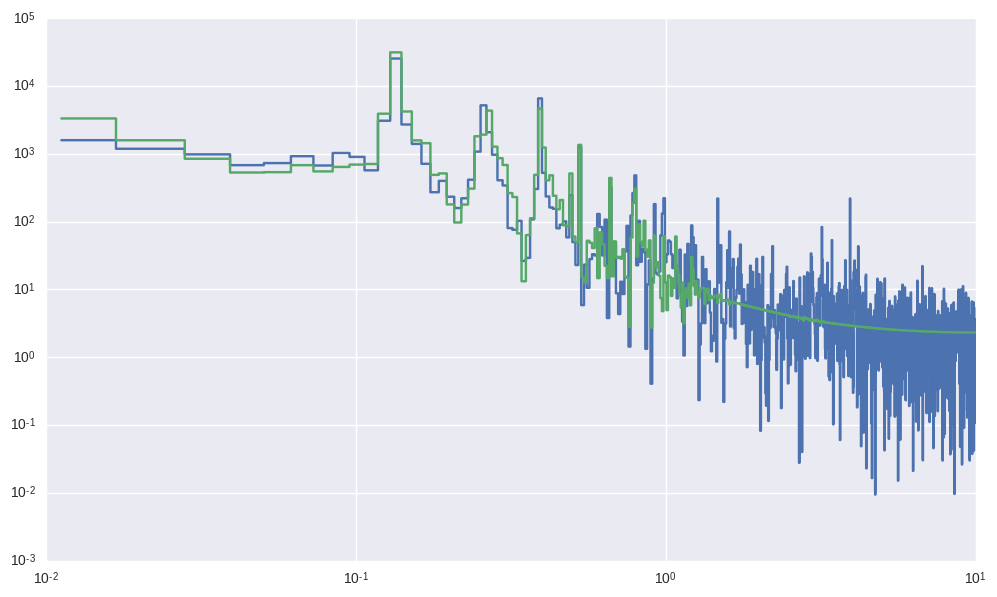

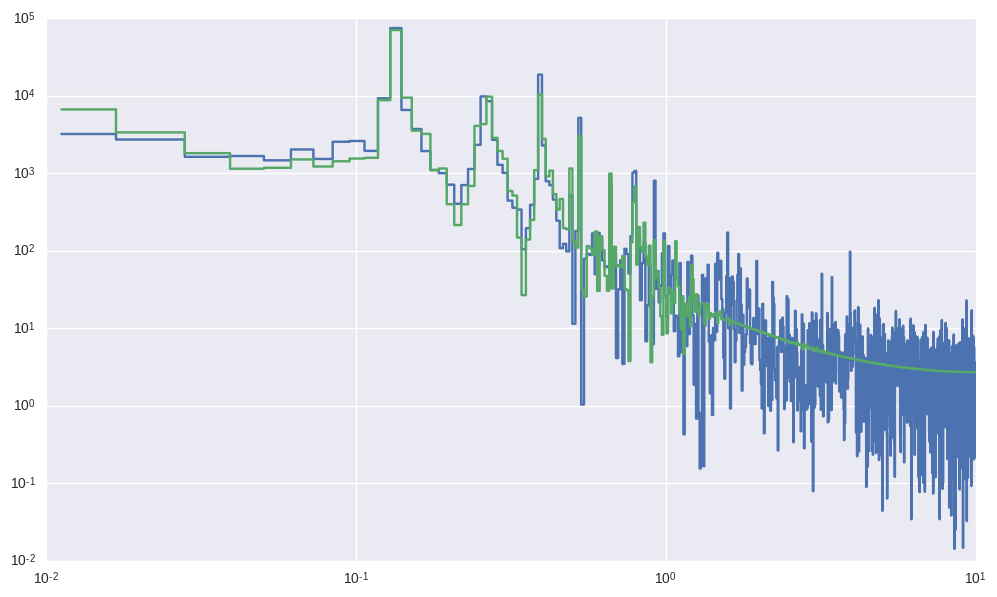

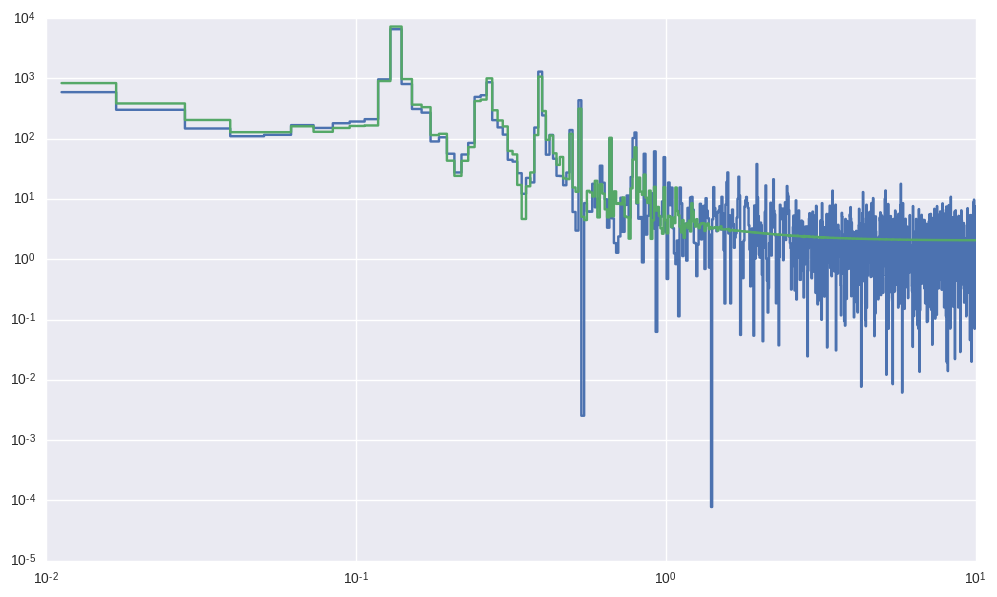

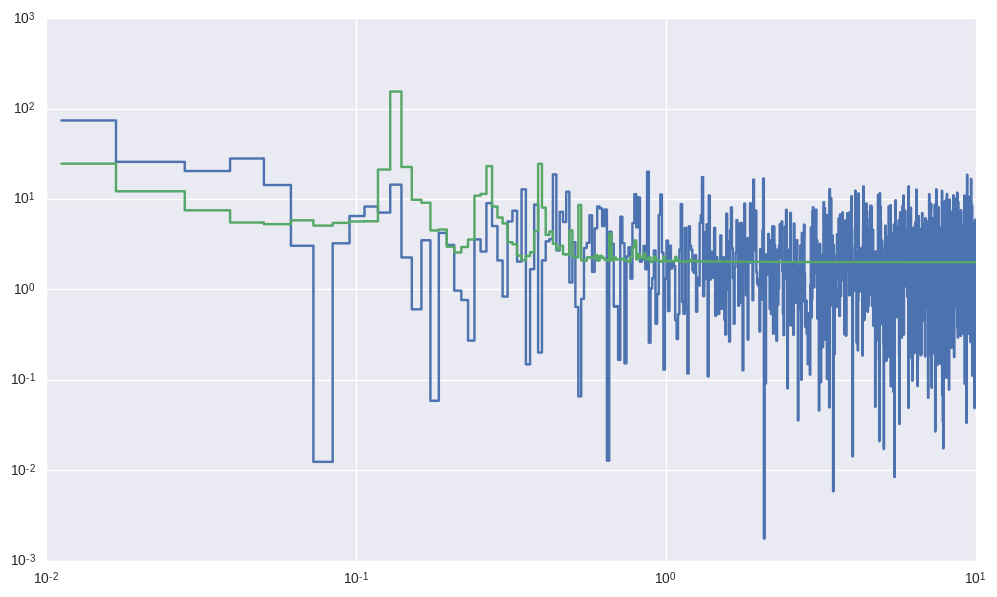

In [38]:
for ps, ps_sim in zip(ps_short, ps_sim_all):
    plt.figure(figsize=(12, 7))
    plt.loglog(ps.freq, ps.power, linestyle="steps-mid")
    plt.loglog(ps_sim.freq, ps_sim.power, linestyle="steps-mid")

Now we can define a Posterior object. We're going to also include a power law component to account for any unmodelled variability in the power spectrum that can't be modeled with our simple pulse profile template.

In [66]:
#logmin = -1.e16

class PSDPosterior(object):
    
    def __init__(self, model, logprior, lc_all, ps_all, lc, energies, 
                 counts, bkg_counts, new_res=0.5):
        
        # the model to use for the pulse fraction amplitudes
        # the model is of the from function(energies, *parameters)
        self.model = model
        
        # the log-prior for the model:
        self.logprior = logprior
        
        # list of all Lightcurve objects
        self.lc_all = lc_all
        
        # list of all power spectra objects
        self.ps_all = ps_all
        
        self.npsd = len(self.ps_all)
        self.nfreq = len(self.ps_all[0].freq)
        
        # light curve to use for making template
        self.lc = lc
        
        # smoothed light curve for making the simulated models:
        self.lc_template = make_template(self.lc, bkg_counts[2], new_res=new_res)
        
        # associated energy bins
        self.energies = energies
        
        # total *source* counts in each energy bin
        self.counts = counts
        
        # total *background* counts in each energy bin
        self.bkg_counts = bkg_counts
        
        # the number of Lorentzians to be fit
        self.new_res = new_res
        
        # number of spectra
        self.nn = self.energies.shape[0]
        
        return

    def loglikelihood(self, t0, neg=False):
        """
        The log-likelihood for the model defined in self.model
        and the parameters in t0. Uses a $\Chi^2$ model for
        the uncertainty.

        Parameters:
        ------------
        t0: {list | numpy.ndarray}
            The list with parameters for the model
            The parameters in list `t0` must be ordered in the following 
            way:
                * power law indices
                * power law log-amplitudes
                * white noise parameters
                * pulse fraction amplitude(s)

            The number of parameters in the last set (i.e. the pulse 
            fraction amplitudes) depends on the model chosen. 

        Returns:
        --------
        logl: float
            The logarithm of the likelihood function for the model and
            parameters given.

        """

        pl_idx = t0[:self.npsd]
        pl_amp = np.exp(t0[self.npsd:2*self.npsd])
        white_noise = t0[2*self.npsd:3*self.npsd]
        amp_pars = t0[3*self.npsd:]
        
        #print("pl_idx: " + str(pl_idx))
        #print("pl_amp: " + str(pl_amp))
        #print("white noie: " + str(white_noise))
        #print("amp_pars: " + str(amp_pars))


        amplitudes = self.model(energies, *amp_pars)
        
        # all mean models
        ps_sim_all = model_psd(self.lc_all, self.lc_template, self.counts, 
                               self.bkg_counts, amplitudes,
                               white_noise, pl_idx, pl_amp)

        for ps_sim in ps_sim_all:
            if not np.all(ps_sim.power > 0):
                return -np.inf
            else:
                continue

        #for i, ps in enumerate(ps_sim_all):
        #    print("PS number : "+ str(i))
        #    print("min(ps.power): " + str(np.min(ps.power)))
        #    print("max(ps.power): " + str(np.max(ps.power)))
        # initialize log-likelihood
        res = 0.0

        # run through all spectra and add log-likelihoods
        for i, (ps, ps_sim) in enumerate(zip(self.ps_all, ps_sim_all)):
            y = ps.power # data
            m = ps_sim.power #model
            res += -np.sum(np.log(m) + y/m)

        #print("log-likelihood: " + str(res) +"\n")
        if neg:
            return -res
        else:
            return res
    
    def logposterior(self, t0, neg=False):
        lpost = self.loglikelihood(t0, neg=False) + self.logprior(t0, self.npsd)
        
        #print("parameters: \n ------------")
        pl_idx = t0[:self.npsd]
        pl_amp = np.exp(t0[self.npsd:2*self.npsd])
        white_noise = t0[2*self.npsd:3*self.npsd]
        amp_pars = t0[3*self.npsd:]
        
        #print("power law indices :" + str(pl_idx))
        #print("power law amplitudes : " + str(pl_amp))
        #print("white noise parameters: " + str(white_noise))
        #print("amplitude parameters: " + str(amp_pars))


        #print("log-likelihood: " + str(self.loglikelihood(t0, neg=False)))
        #print("log-prior: " + str(self.logprior(t0, self.npsd)))
        #print("log-posterior: " + str(lpost) + "\n")
        #if not np.isfinite(lpost):
        #    lpost = logmin

        if neg is True:
            return -lpost
        else:
            return lpost

    def __call__(self, t0, neg=False):
        return self.logposterior(t0, neg=neg)




## Defining parametric models

Now we can define parametric models for the pulse amplitude. We are going to include 2 models:
(1) The pulse amplitude is constant across all four energy bins
(2) The pulse amplitude varies across the four energy bins.

For model $M_1$, we will choose a parametrization such that $A(E) = C$, where $C$ is a constant and a model parameter. For the more complex model $M_2$, we choose a parametrization that makes the models straightforwardly nested: here, $A_i = C + a_i$ for all energy bins $i$, where $C$ is a shared scaling parameter between all energy bins, and the set of $\{a_i\}$ parameters define an offset from that scaling.

First, we'll define the simpler model and its prior:

In [67]:
def m1(e, amp):
    return np.ones(len(e))*amp

The prior will include both the priors for the amplitude as well as for the power law and white noise parameters:

In [68]:
def m1_logprior(t0, npsd):
        """
        Prior for the first model. 
        The parameters in list `t0` must be ordered in the following 
        way:
            * power law indices
            * power law log-amplitudes
            * white noise parameters
            * pulse fraction amplitude(s)
            
        The number of parameters in the last set (i.e. the pulse 
        fraction amplitudes) depends on the model chosen. Here, it 
        is 1.
            
        """
        
        pl_idx = t0[:npsd]
        pl_logamp = t0[npsd:2*npsd]
        white_noise = t0[2*npsd:3*npsd]
        amp_pars = t0[3*npsd:]
        
        # initialize logprior:
        logpr = 0.0
        
        # power law index hyper parameters:
        pl_ind_low = 0.0
        pl_ind_high = 4.0
        for idx in pl_idx:
            if ((pl_ind_low <= idx) & (idx <= pl_ind_high)):
                logpr += 0.0
            else:
                logpr += -np.inf
                
            #logpr += np.log(((pl_ind_low <= idx) & (idx <= pl_ind_high)))
     
        # power law log-amplitude prior:
        pl_logamp_low = -10.0
        pl_logamp_high = 10.0
        
        for logamp in pl_logamp:
            if ((pl_logamp_low <= logamp) & (logamp <= pl_logamp_high)):
                logpr += 0.0
            else:
                logpr += -np.inf
#            logpr += np.log(((pl_logamp_low <= logamp) & (logamp <= pl_logamp_high)))

        # white noise prior:
        wn_loc = 2.0
        wn_scale = 0.1
        
        wn_prior = scipy.stats.norm(loc=wn_loc, scale=wn_scale)
        for wn in white_noise:
            if wn < 0:
                logpr += -np.inf
            else:
                logpr += wn_prior.logpdf(wn)

        # amplitude hyperparameters
        amp_loc = 1.0 # mean of the Gaussian prior distribution
        amp_scale = 0.3 # scale of the Gaussian prior distribution
        amp_prior = scipy.stats.norm(loc=amp_loc, scale=amp_scale)
        
        if amp_pars[0] < 0:
            logpr += -np.inf
        else:
            logpr += amp_prior.logpdf(amp_pars[0])

        return logpr


Let's also define the second model. Here, the first of the parameters is the constant scaling factor for the light curves. The other parameters define the offset for each energy bin from that scaling factor:

In [69]:
def m2(e, *pars):
    p = list(pars)
    c = p[0]
    return c + np.array(p[1:])


Similarly, we will define priors for this model, too. Note that the constant scaling will have the same prior as the amplitude above, while the offsets will have a normal prior centred on 0:

In [70]:

def m2_logprior(t0, npsd):
        """
        Prior for the first model. 
        The parameters in list `t0` must be ordered in the following 
        way:
            * power law indices
            * power law log-amplitudes
            * white noise parameters
            * pulse fraction amplitude(s)
            
        The number of parameters in the last set (i.e. the pulse 
        fraction amplitudes) depends on the model chosen. Here, it 
        is 1.
            
        """
        
        pl_idx = t0[:npsd]
        pl_logamp = t0[npsd:2*npsd]
        white_noise = t0[2*npsd:3*npsd]
        amp_pars = t0[3*npsd:]
        
        # initialize logprior:
        logpr = 0.0
        
        # power law index hyper parameters:
        pl_ind_low = 0.0
        pl_ind_high = 4.0
        for idx in pl_idx:
            if ((pl_ind_low <= idx) & (idx <= pl_ind_high)):
                logpr += 0.0
            else:
                logpr += -np.inf
#            logpr += np.log(((pl_ind_low <= idx) & (idx <= pl_ind_high)))
            
        # power law log-amplitude prior:
        pl_logamp_low = -10.0
        pl_logamp_high = 10.0
        
        for logamp in pl_logamp:
            if ((pl_logamp_low <= logamp) & (logamp <= pl_logamp_high)):
                logpr += 0.0
            else:
                logpr += -np.inf
#            logpr += np.log(((pl_logamp_low <= logamp) & (logamp <= pl_logamp_high)))

        # white noise prior:
        wn_loc = 2.0
        wn_scale = 0.05
        
        wn_prior = scipy.stats.norm(loc=wn_loc, scale=wn_scale)
        for wn in white_noise:
            if wn < 0:
                logpr += -np.inf
            else:
                logpr += wn_prior.logpdf(wn)


        # constant shared amplitude factor
        # hyperparameters
        amp_loc = 1.0 # mean of the Gaussian prior distribution
        amp_scale = 0.2 # scale of the Gaussian prior distribution
        amp_prior = scipy.stats.norm(loc=amp_loc, scale=amp_scale)
        
        const_amp = amp_pars[0]
        
        if const_amp < 0:
            logpr += -np.inf
        else:
            logpr += amp_prior.logpdf(const_amp)

        # modification from the constant amplitude for each energy
        ampmod_loc = 0.0 # mean of the Gaussian prior distribution
        ampmod_scale = 0.1 # scale of the Gaussian prior distribution
        ampmod_prior = scipy.stats.norm(loc=ampmod_loc, scale=ampmod_scale)

        for amp in amp_pars[1:]:
            if (const_amp + amp) < 0:
                logpr += -np.inf
            else:
                logpr += ampmod_prior.logpdf(amp)
        
        return logpr
        

Now we can define posterior objects for both and try an example:

In [71]:
lpost1 = PSDPosterior(m1, m1_logprior, lc_all, ps_short, lc_all[2], 
                      energies, counts, bkg_counts, new_res=0.5)
lpost2 = PSDPosterior(m2, m2_logprior, lc_all, ps_short, lc_all[2], 
                      energies, counts, bkg_counts, new_res=0.5)

Let's again make some example parameters:

In [72]:
white_noise = [2.0, 2.0, 2.0, 2.0]
pl_idx = [2.0, 2.0, 2.0, 2.0]
pl_amplitudes = [0.1, 0.1, 0.05, 0.05]
amplitudes = [1.0, 0.0, 0.0, 0.0, 0.0]


In [73]:
# for mode 1, we only use the first value in `amplitudes`:
theta_test1 = np.hstack([pl_idx, np.log(pl_amplitudes), 
                         white_noise, amplitudes[0]])

theta_test2 = np.hstack([pl_idx, np.log(pl_amplitudes), 
                         white_noise, amplitudes])

In [74]:
m1_logprior(theta_test1, npsd=4)

5.8196205102787548

In [75]:
lpost1(theta_test1)

-9332.7895479383078

In [76]:
m2_logprior(theta_test2, npsd=4)

14.532260579784191

In [77]:
lpost2(theta_test2)

-9324.0769078688027

For the optimization, we need to set bounds so the optimizer doesn't wander off into regions not allowed by the prior:

In [78]:
bounds1 = [(0, 4), (0, 4), (0, 4), (0, 4),
           (-10, 10), (-10, 10), (-10, 10), (-10, 10),
           (0, 10), (0, 10), (0, 10), (0, 10), 
           (0, 2)]

bounds2 = [(0, 4), (0, 4), (0, 4), (0,4),
           (-10, 10), (-10, 10), (-10, 10), (-10, 10),
           (0, 10), (0, 10), (0, 10), (0, 10), 
           (0, 2), 
           (-1, 1), (-1, 1), (-1, 1), (-1, 1)]



Let's try to optimize this model:

In [79]:
import scipy.optimize
opt1 = scipy.optimize.minimize(lpost1, theta_test1, bounds=bounds1,
                              method="SLSQP",
                              args=(True), tol=1.e-10)

opt2 = scipy.optimize.minimize(lpost2, theta_test2, bounds=bounds2,
                              method="SLSQP",
                              args=(True), tol=1.e-10)



/scratch/daniela/repositories/stingray/stingray/crossspectrum.py:237: RuntimeWarning: invalid value encountered in log
  log_nphots1 = np.log(self.nphots1)
/scratch/daniela/repositories/stingray/stingray/crossspectrum.py:238: RuntimeWarning: invalid value encountered in log
  log_nphots2 = np.log(self.nphots2)
/scratch/daniela/sw/miniconda/envs/py3/lib/python3.5/site-packages/ipykernel/__main__.py:94: RuntimeWarning: invalid value encountered in greater


In [80]:
opt1

     fun: 9074.2287672644288
     jac: array([ 0.        ,  0.        , -0.00012207,  0.00012207,  0.        ,
        0.        ,  0.00012207,  0.        ,  0.        ,  0.        ,
        0.        , -0.00012207,  0.        ,  0.        ])
 message: 'Optimization terminated successfully.'
    nfev: 773
     nit: 49
    njev: 49
  status: 0
 success: True
       x: array([ 1.3824293 ,  1.65306079,  1.12052425,  0.36583228,  2.71459334,
        2.71388987,  1.06620835,  0.27696643,  1.8485085 ,  1.90959377,
        1.92715474,  2.02838429,  0.81938836])

In [81]:
opt2

     fun: 9066.2104496654156
     jac: array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.00012207,  0.        ,  0.        ,  0.        ,
        0.00012207, -0.00012207,  0.        ,  0.00012207, -0.00012207,
        0.        ,  0.        ,  0.        ])
 message: 'Optimization terminated successfully.'
    nfev: 817
     nit: 41
    njev: 41
  status: 0
 success: True
       x: array([ 1.41174901,  1.67397865,  1.13078801,  0.4028981 ,  2.7401247 ,
        2.68407049,  0.97227058,  0.34650746,  1.95891314,  1.97454262,
        1.97851298,  2.00955988,  0.79755147, -0.05019424,  0.0298159 ,
        0.06424312, -0.09447857])

In [82]:
print(opt1.fun)
print(opt2.fun)

9074.22876726
9066.21044967


In [83]:
opt1.x

array([ 1.3824293 ,  1.65306079,  1.12052425,  0.36583228,  2.71459334,
        2.71388987,  1.06620835,  0.27696643,  1.8485085 ,  1.90959377,
        1.92715474,  2.02838429,  0.81938836])

What do the best-fit power spectra look like?

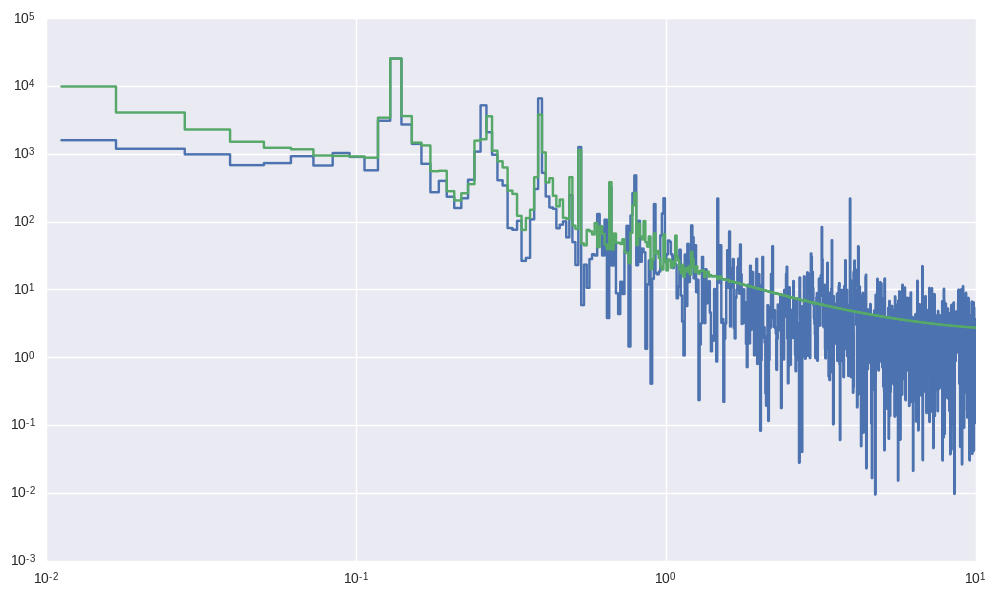

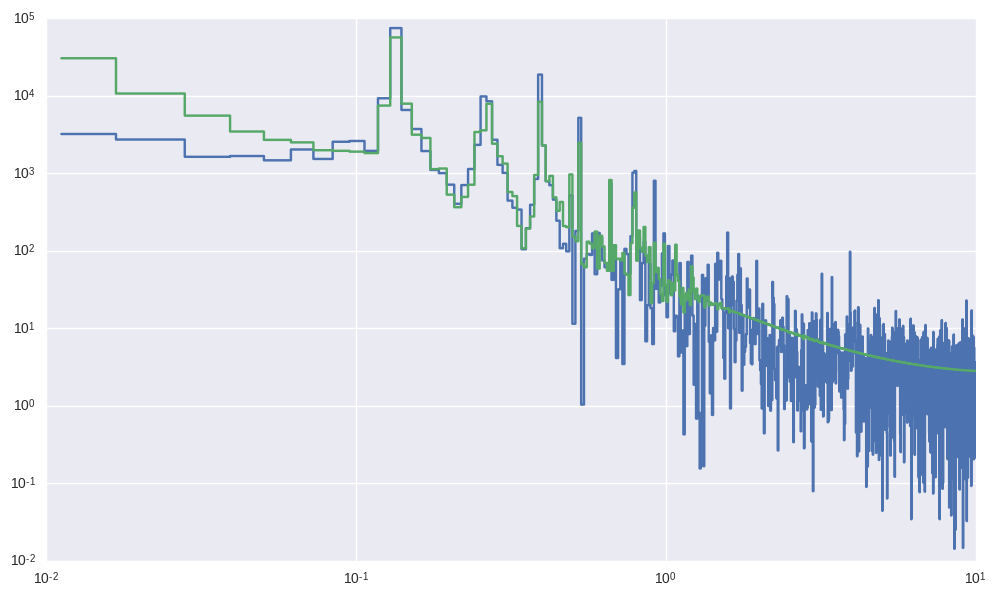

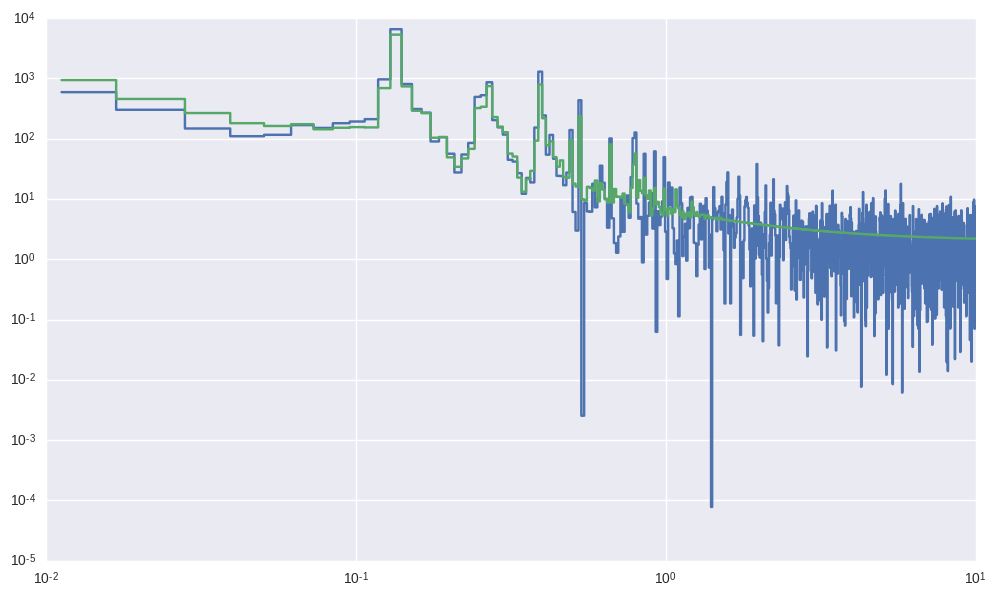

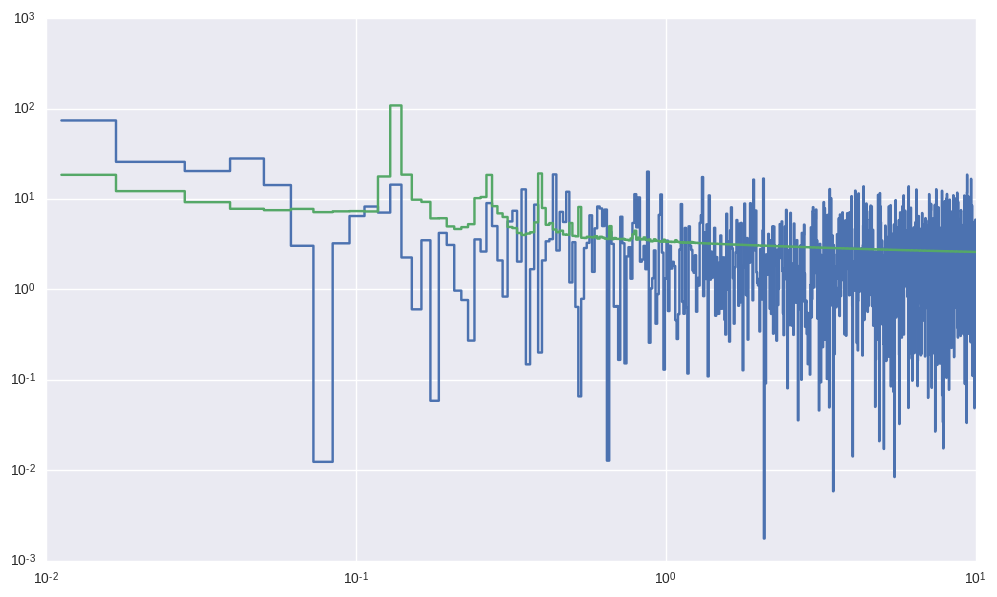

In [84]:
pl_idx = opt1.x[:npsd]
pl_amp = np.exp(opt1.x[npsd:2*npsd])
white_noise = opt1.x[2*npsd:3*npsd]
amp_pars = m1(energies, opt1.x[3*npsd:])

ps_sim_all = model_psd(lc_short, lc_template, counts, bkg_counts, 
                       amp_pars, white_noise, 
                       pl_idx, pl_amp)

for ps, ps_sim in zip(ps_short, ps_sim_all):
    plt.figure(figsize=(12, 7))
    plt.loglog(ps.freq, ps.power, linestyle="steps-mid")
    plt.loglog(ps_sim.freq, ps_sim.power, linestyle="steps-mid")

What about the second model?

In [85]:
opt2.x

array([ 1.41174901,  1.67397865,  1.13078801,  0.4028981 ,  2.7401247 ,
        2.68407049,  0.97227058,  0.34650746,  1.95891314,  1.97454262,
        1.97851298,  2.00955988,  0.79755147, -0.05019424,  0.0298159 ,
        0.06424312, -0.09447857])

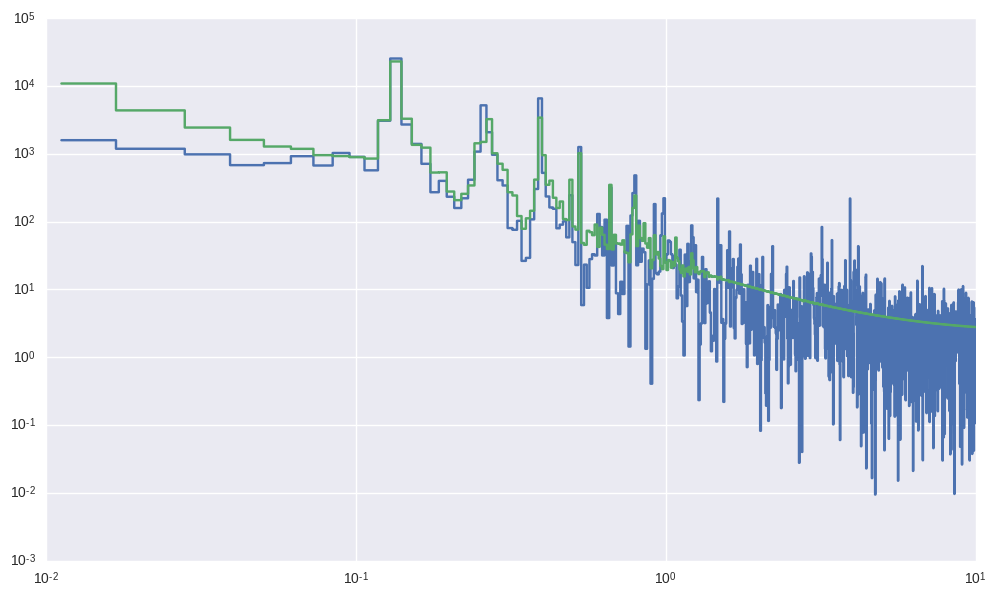

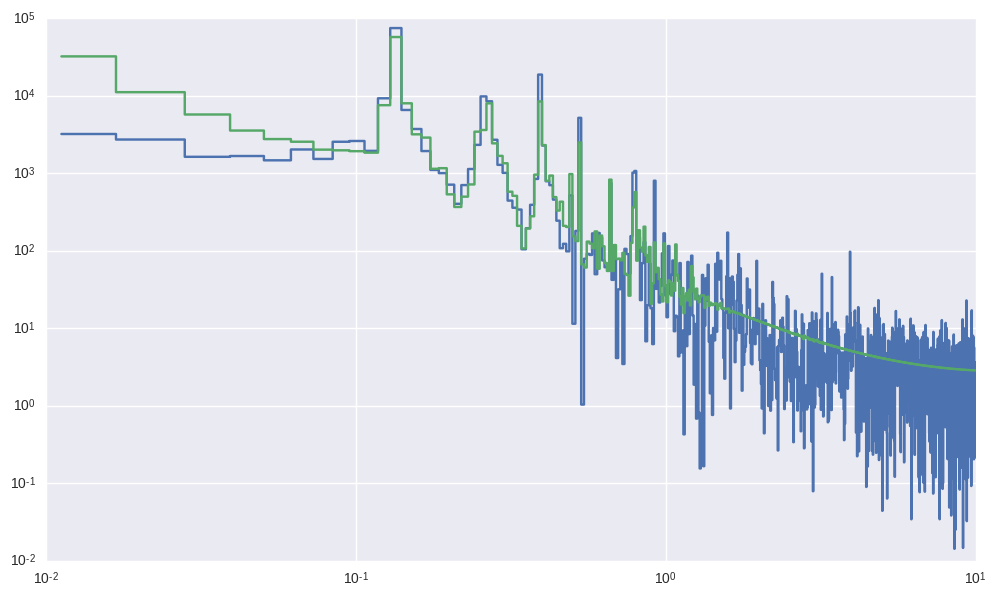

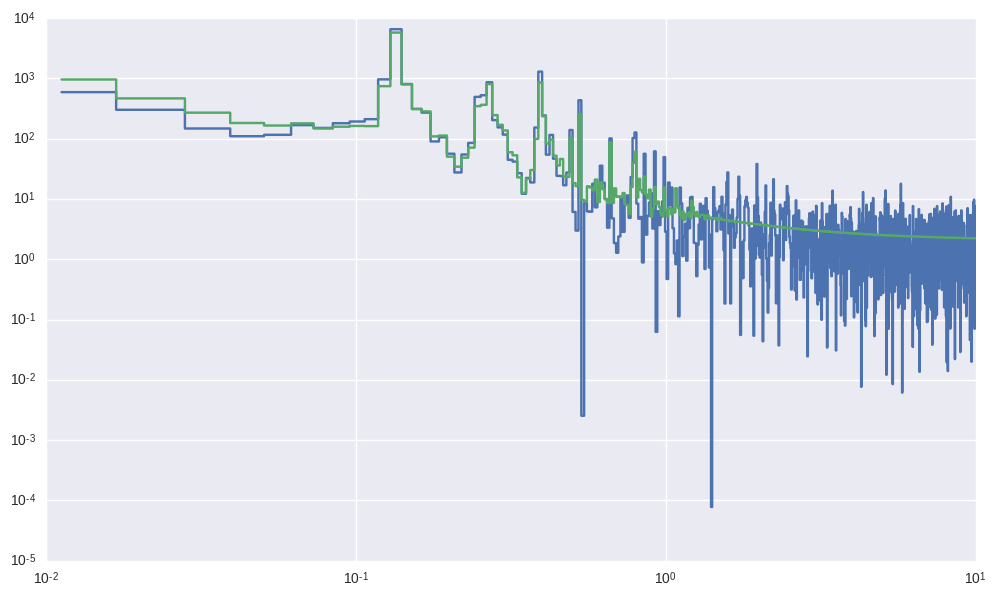

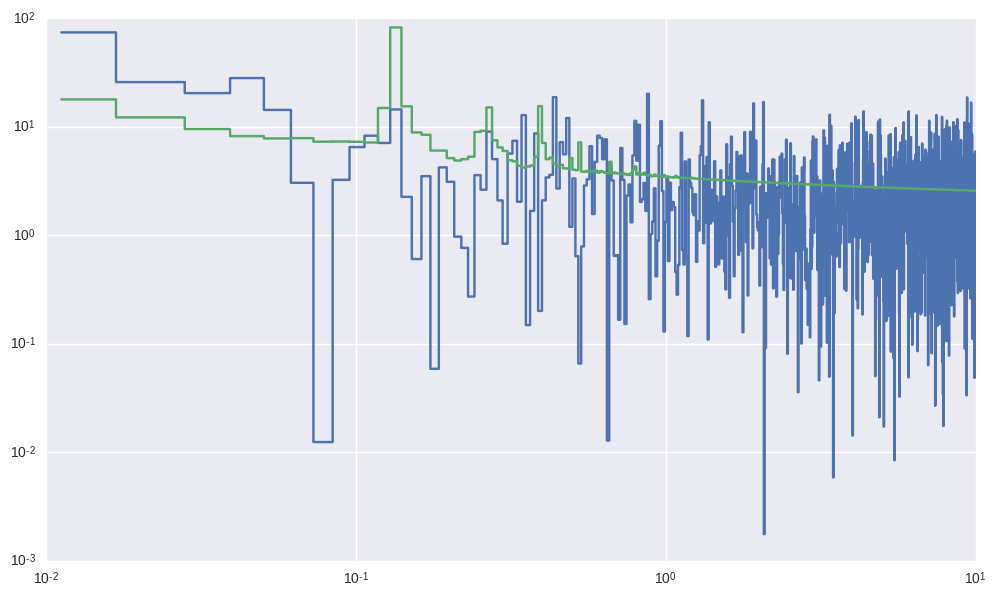

In [86]:
pl_idx = opt2.x[:npsd]
pl_amp = np.exp(opt2.x[npsd:2*npsd])
white_noise = opt2.x[2*npsd:3*npsd]
amp_pars = m2(energies, *opt2.x[3*npsd:])

ps_sim_all = model_psd(lc_short, lc_template, counts, bkg_counts, 
                       amp_pars, white_noise, 
                       pl_idx, pl_amp)

for ps, ps_sim in zip(ps_short, ps_sim_all):
    plt.figure(figsize=(12, 7))
    plt.loglog(ps.freq, ps.power, linestyle="steps-mid")
    plt.loglog(ps_sim.freq, ps_sim.power, linestyle="steps-mid")

Hmmm, that's not super great. But it might be good enough to initialize MCMC. Let's first, however, compute the Bayesian Information Criterion (BIC) for each. The BIC is a tool for model comparison. It's not a very good one, but it might be good enough to give us an indication of what's going on:

In [87]:
def bic(lpost, best_pars):
    npsd = len(lpost.ps_all)
    nfreq = len(lpost.ps_all[0].freq)
    b = -2.*lpost.loglikelihood(best_pars) + len(best_pars)*np.log(npsd*nfreq)
    return b


In [88]:
bic1 = bic(lpost1, opt1.x)
bic2 = bic(lpost2, opt2.x)

delta_bic = bic2 - bic1

print("The BIC for M1 is: " + str(bic1))
print("The BIC for M2 is: " + str(bic2))
print("The difference in BIC between the two models is: " + str(delta_bic))

The BIC for M1 is: 18262.3039094
The BIC for M2 is: 18296.6575432
The difference in BIC between the two models is: 34.3536337924


That seems to prefer the simpler model. I am not sure about this, though. So we're going to run MCMC and then use the Savage-Dickey Density Ratio, an approximation of the Bayes factor (which is better suited for model comparison) for nested models.

This is why I set this model up this way in the first place. :)

So, for the first model:

In [89]:
opt1.x/3.0

array([ 0.46080977,  0.55102026,  0.37350808,  0.12194409,  0.90486445,
        0.90462996,  0.35540278,  0.09232214,  0.6161695 ,  0.63653126,
        0.64238491,  0.6761281 ,  0.27312945])

In [147]:
ndim = len(theta_test1)
nwalkers = 1000
burnin = 1000
niter = 200

# sample random starting positions for each walker from
# a multivariate Gaussian
p0 = np.array([np.random.multivariate_normal(opt1.x, np.diag(np.abs(opt1.x))/10.0) for
               i in range(nwalkers)])

# initialize the sampler
sampler1 = emcee.EnsembleSampler(nwalkers, ndim, lpost1, args=[False],
                                threads=15)



In [148]:
# run the burn-in
pos1, prob1, state1 = sampler1.run_mcmc(p0, burnin)
sampler1.reset()

/scratch/daniela/sw/miniconda/envs/py3/lib/python3.5/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
/scratch/daniela/sw/miniconda/envs/py3/lib/python3.5/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater
  accept = (lnpdiff > np.log(self._random.rand(len(lnpdiff))))


In [149]:
# do the actual MCMC run
_, _, _ = sampler1.run_mcmc(pos1, niter, rstate0=state1)


Let's look at a trace plot of the chains:

In [150]:
parnames = ["PL Index 1", "PL Index 2", "PL Index 3", "PL Index 4",
            "PL logAmp 1", "PL logAmp 2", "PL logAmp 3", "PL logAmp 4",
            "White Noise 1", "White Noise 2", "White Noise 3", "White Noise 4",
            "Pulse Constant"]

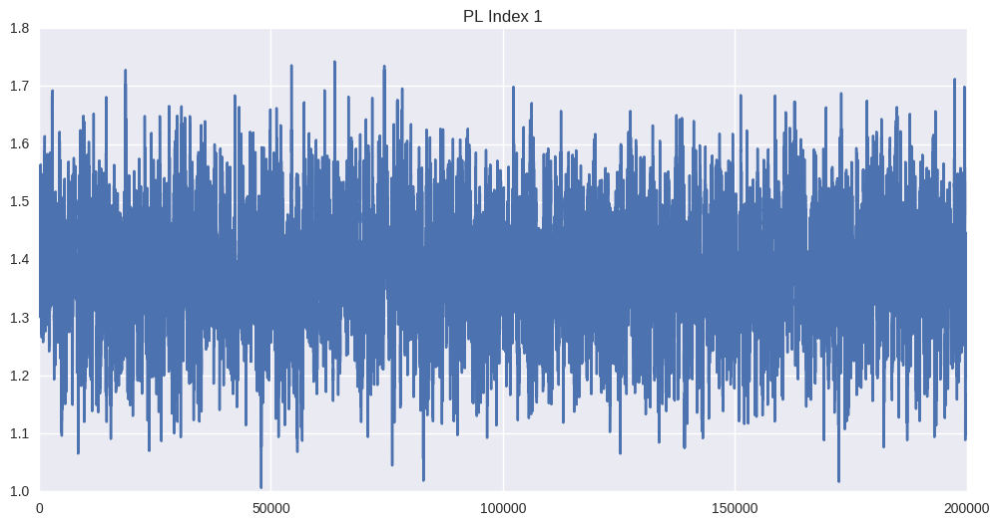

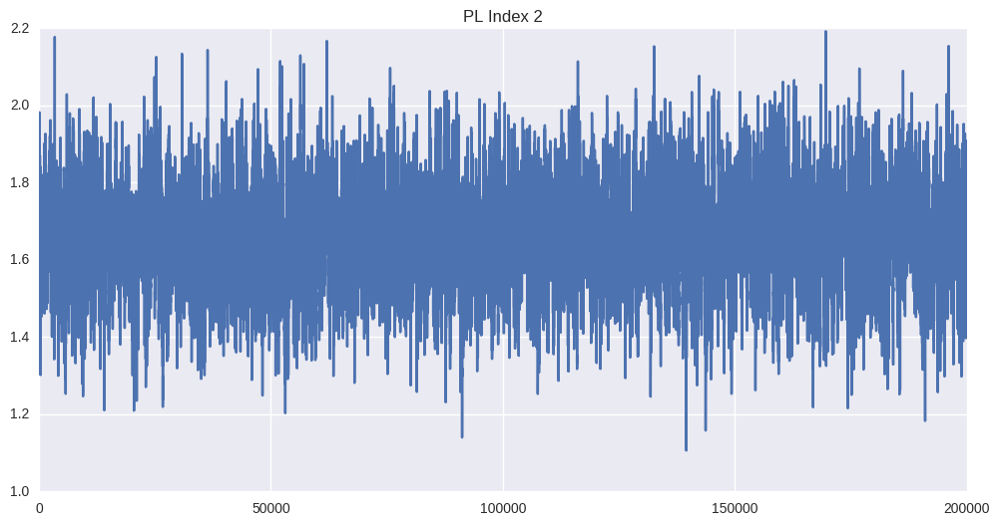

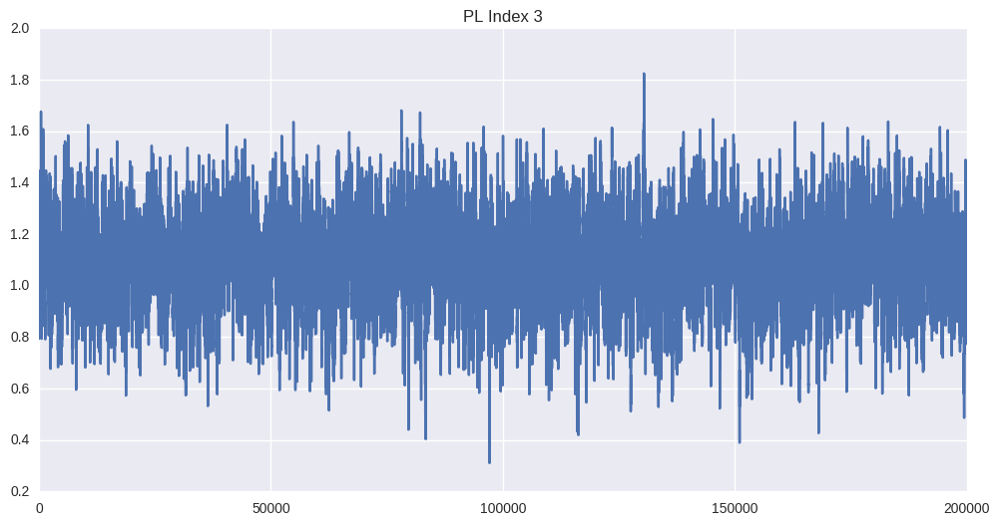

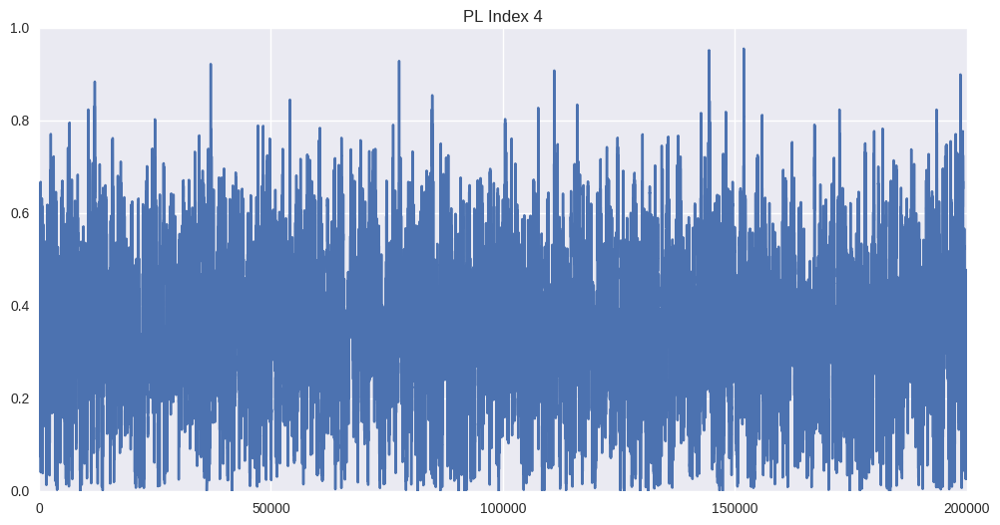

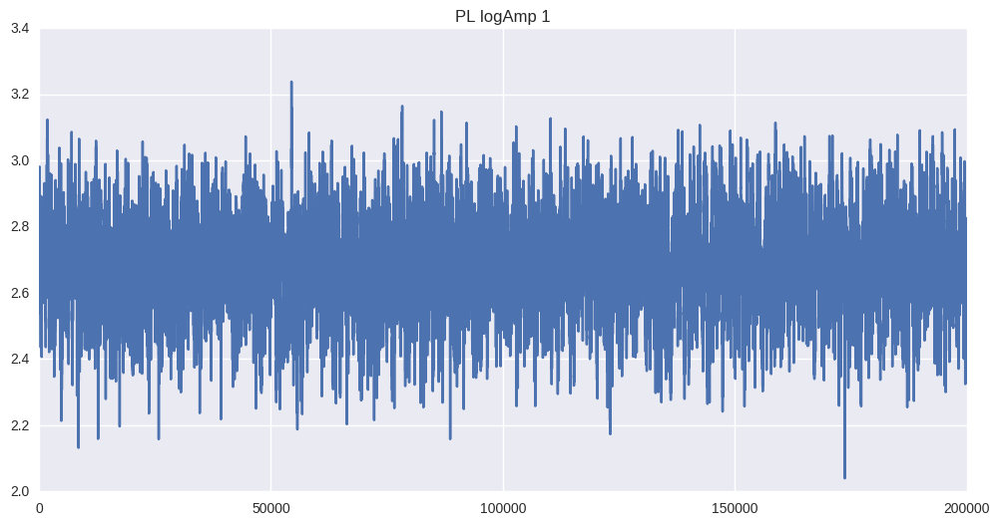

...

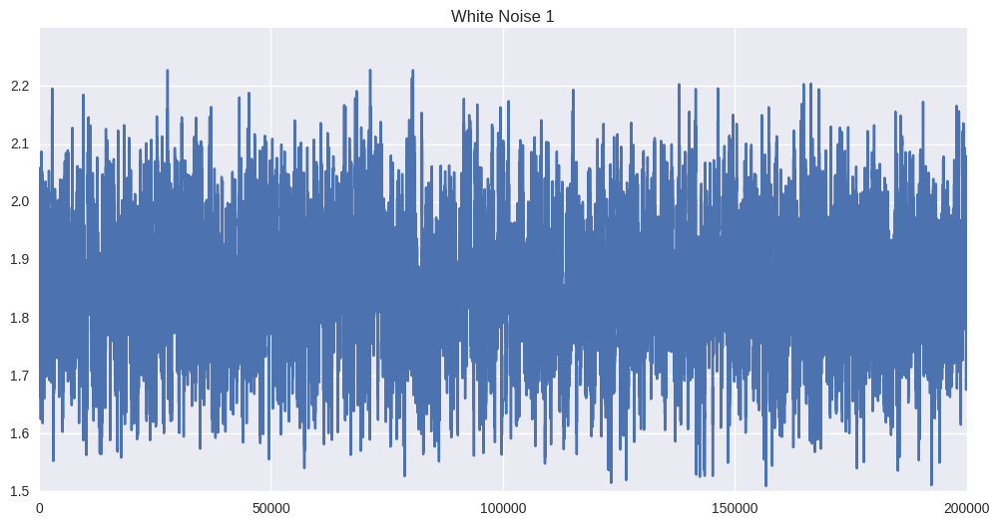

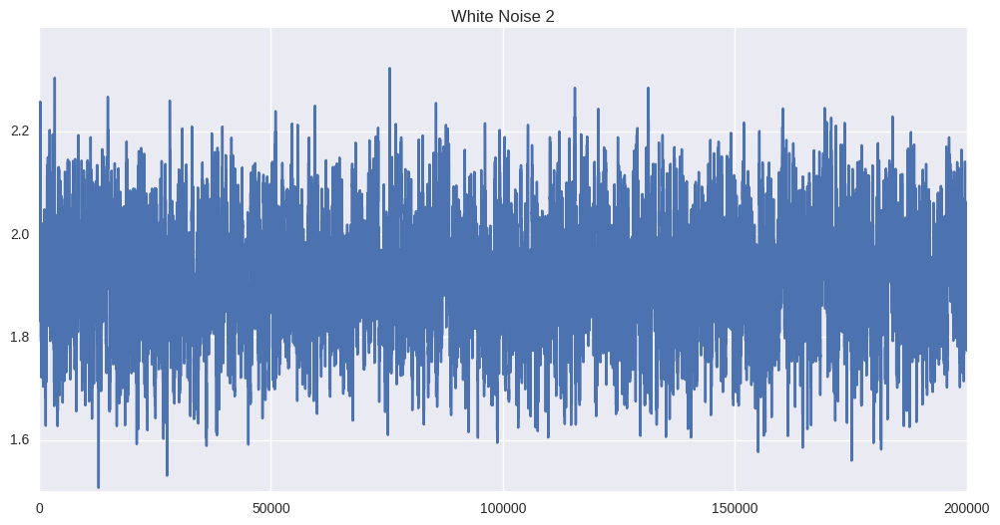

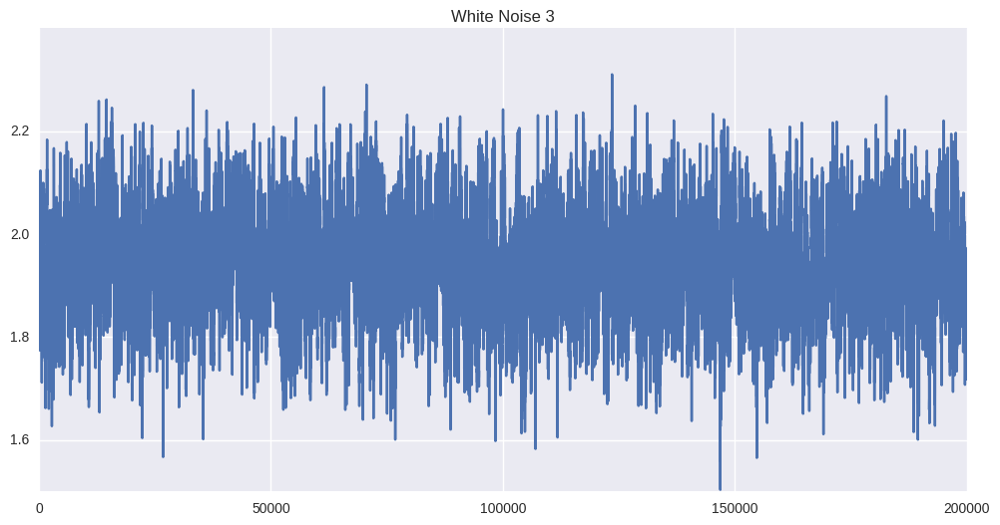

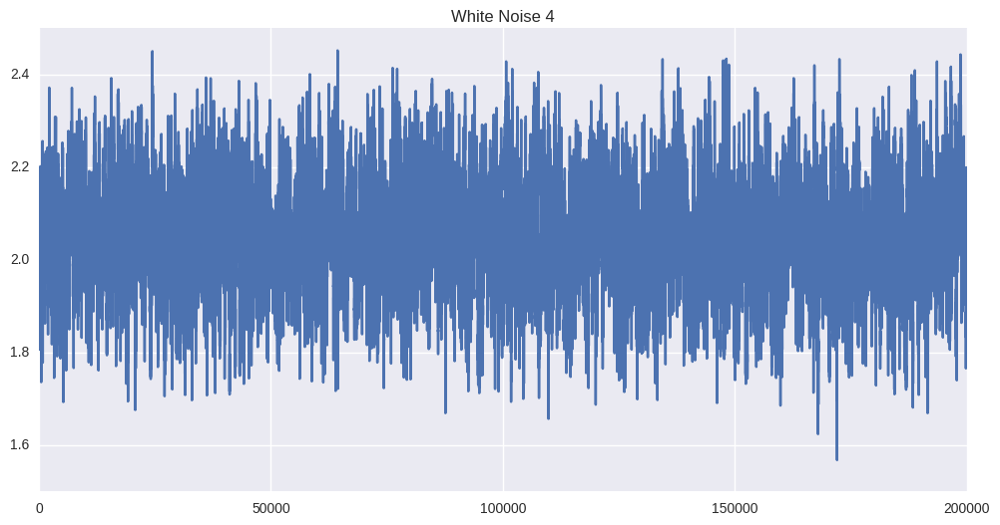

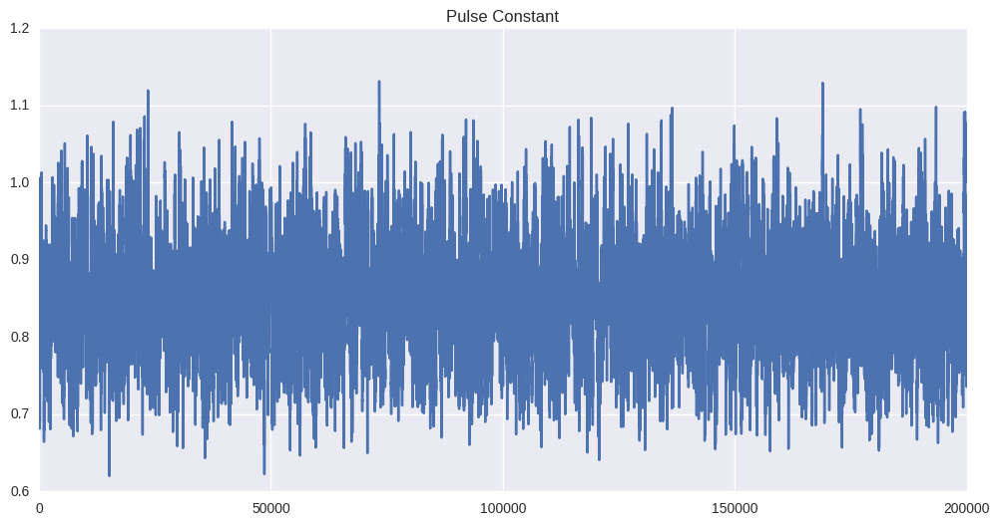

In [152]:
for i in range(sampler1.flatchain.shape[1]):
    plt.figure(figsize=(12,6))
    plt.plot(sampler1.flatchain[:,i])
    plt.title(parnames[i])

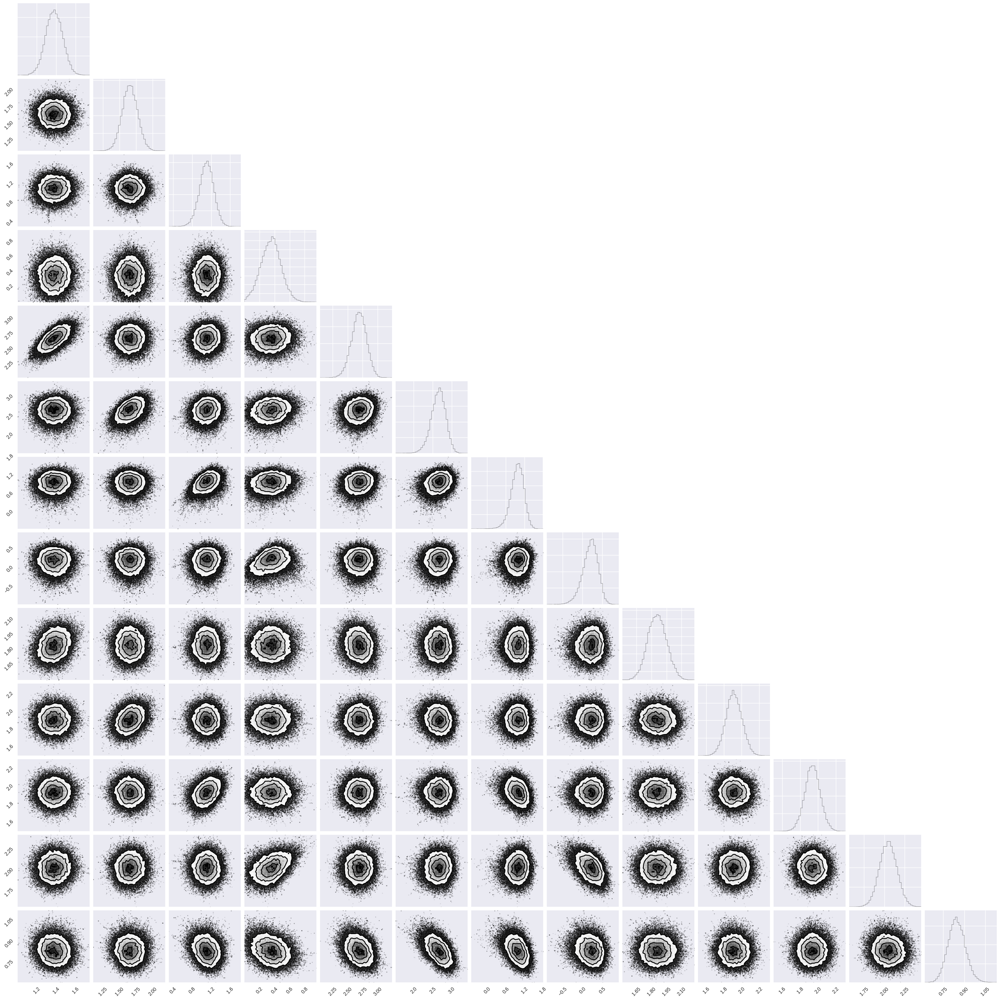

In [153]:
_ = corner.corner(sampler1.flatchain,bins=40)

Let's also make a function to compute examples of the PSD and then bands on the power spectrum:

In [154]:
def psd_examples(lc_all, lc_smooth, nsims, counts, bkg_counts, sampler, lpost):
    ps_sim_all = []
    
    p_idx = np.random.choice(np.arange(sampler.flatchain.shape[0], dtype=int),
                             size=nsims, replace=False)
    
    for p in p_idx:
        pars = sampler.flatchain[p]
        pl_idx = pars[:lpost.npsd]
        pl_amp = np.exp(pars[lpost.npsd:2*lpost.npsd])
        white_noise = pars[2*lpost.npsd:3*lpost.npsd]
        amp_pars = lpost.model(energies, *pars[3*lpost.npsd:])

        ps_sim_all.append(model_psd(lc_all, lc_smooth, counts, bkg_counts, 
                                    amp_pars, white_noise, 
                                    pl_idx, pl_amp))

        
    return ps_sim_all

In [159]:
def compute_psd_bands(ps_sim_all, percentiles=[1, 50, 99]):
    npsd = len(ps_sim_all[0]) # number of PSDs in each entry in ps_sim_all
    nfreq = ps_sim_all[0][0].freq.shape[0] # number of frequencies in each PSD
    
    lower_bound = np.zeros((npsd, nfreq))
    median = np.zeros((npsd, nfreq))
    upper_bound = np.zeros((npsd, nfreq))
    
    for i in range(npsd):
        for j in range(nfreq):
            powers = np.array([ps_list[i].power[j] for ps_list in ps_sim_all])
            bounds = np.percentile(powers, percentiles*100)
            lower_bound[i,j] = bounds[0]
            median[i,j] = bounds[1]
            upper_bound[i,j] = bounds[2]
    return lower_bound, median, upper_bound

In [163]:
ps_sim_all1 = psd_examples(lc_short, lc_template, 5000, counts, bkg_counts, sampler1, lpost1)

In [164]:
lower_bound1, median1, upper_bound1 = compute_psd_bands(ps_sim_all1)

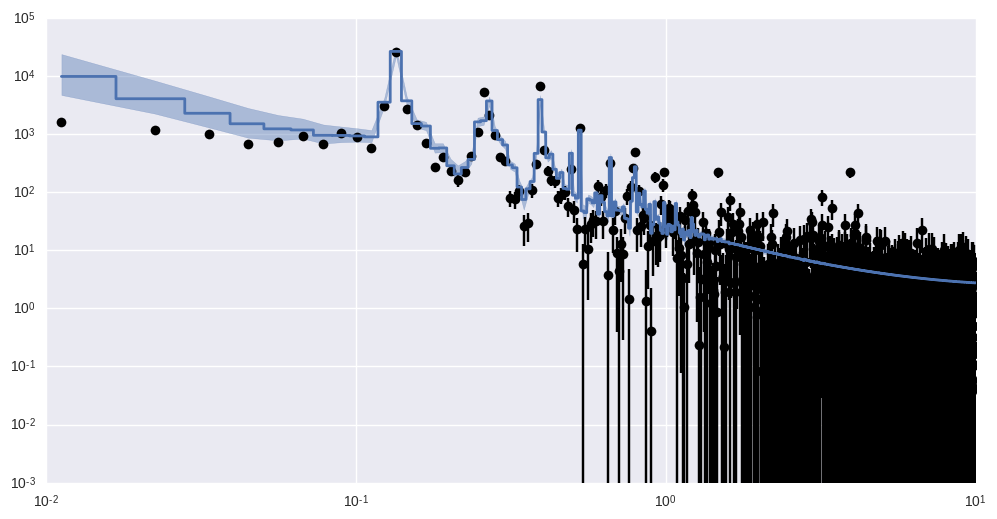

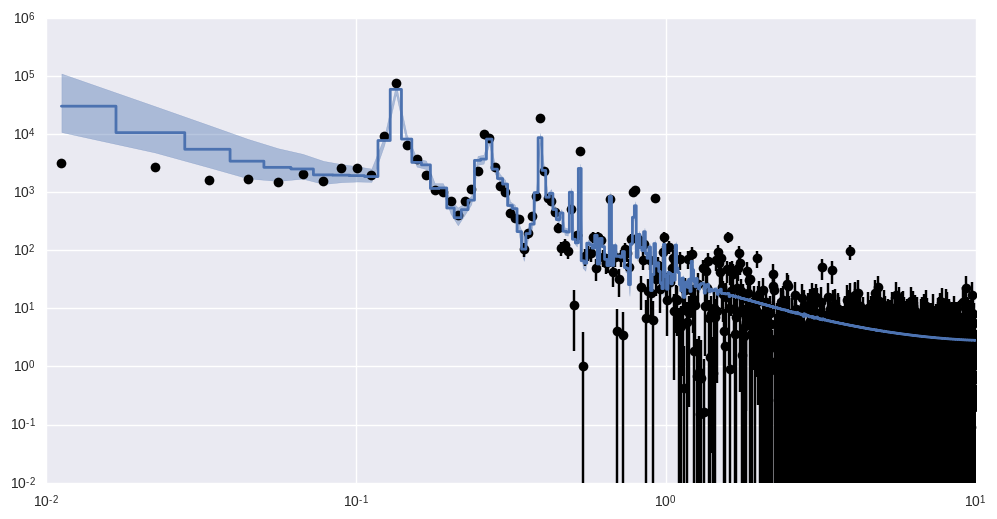

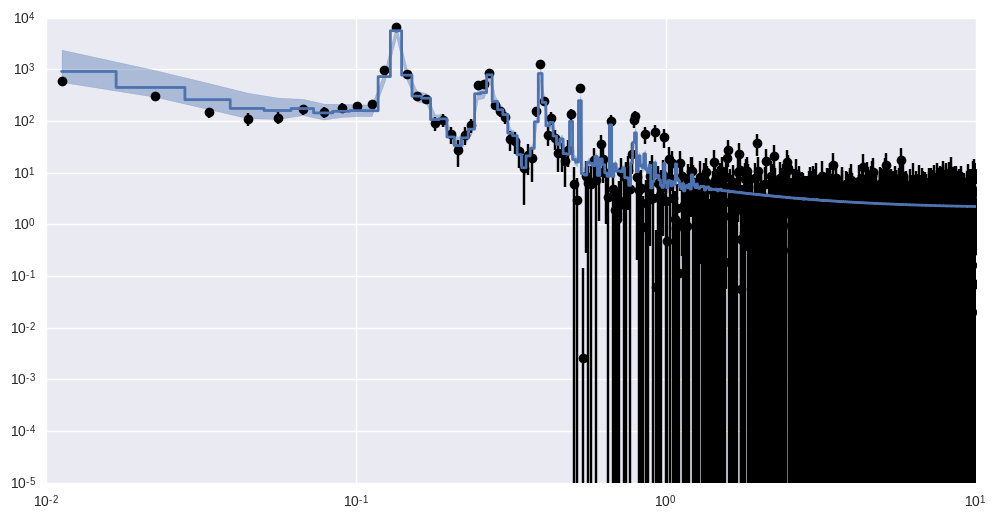

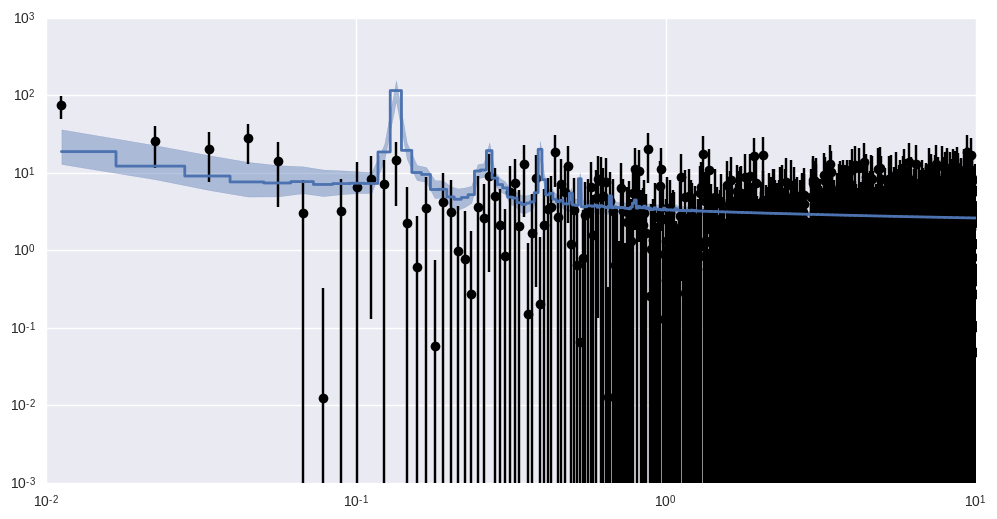

In [165]:
for i in range(npsd):
    ps = ps_short[i]
    lb = lower_bound1[i]
    med = median1[i]
    ub = upper_bound1[i]
    plt.figure(figsize=(12,6))
    plt.errorbar(ps.freq, ps.power, yerr=2.*np.sqrt(2.*ps.power), fmt="o", color="black")
    plt.xscale("log")
    plt.yscale("log")#, linestyle="steps-mid", color="black", lw=3)
    plt.plot(ps.freq, med, linestyle="steps-mid", color=sns.color_palette()[0], lw=2)
    plt.fill_between(ps.freq, lb, ub, color=sns.color_palette()[0], alpha=0.4)
    

Ok, cool. That looks not bad. Let's do the same with the more complicated model:

In [168]:
ndim = len(theta_test2)
nwalkers = 1000
burnin = 1000
niter = 200

# sample random starting positions for each walker from
# a multivariate Gaussian
p0 = np.array([np.random.multivariate_normal(opt2.x, np.diag(np.abs(opt2.x))/5.0) for
               i in range(nwalkers)])

# initialize the sampler
sampler2 = emcee.EnsembleSampler(nwalkers, ndim, lpost2, args=[False],
                                threads=15)




In [169]:
# run the burn-in
pos2, prob2, state2 = sampler2.run_mcmc(p0, burnin)
sampler2.reset()

# do the actual MCMC run
_, _, _ = sampler2.run_mcmc(pos2, niter, rstate0=state2)


/scratch/daniela/sw/miniconda/envs/py3/lib/python3.5/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
/scratch/daniela/sw/miniconda/envs/py3/lib/python3.5/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater
  accept = (lnpdiff > np.log(self._random.rand(len(lnpdiff))))


In [170]:
parnames = ["PL Index 1", "PL Index 2", "PL Index 3", "PL Index 4",
            "PL logAmp 1", "PL logAmp 2", "PL logAmp 3", "PL logAmp 4",
            "White Noise 1", "White Noise 2", "White Noise 3", "White Noise 4",
            "Pulse Constant",
            "Pulse Offset 1", "Pulse Offset 2", "Pulse Offset 3", "Pulse Offset 4"]

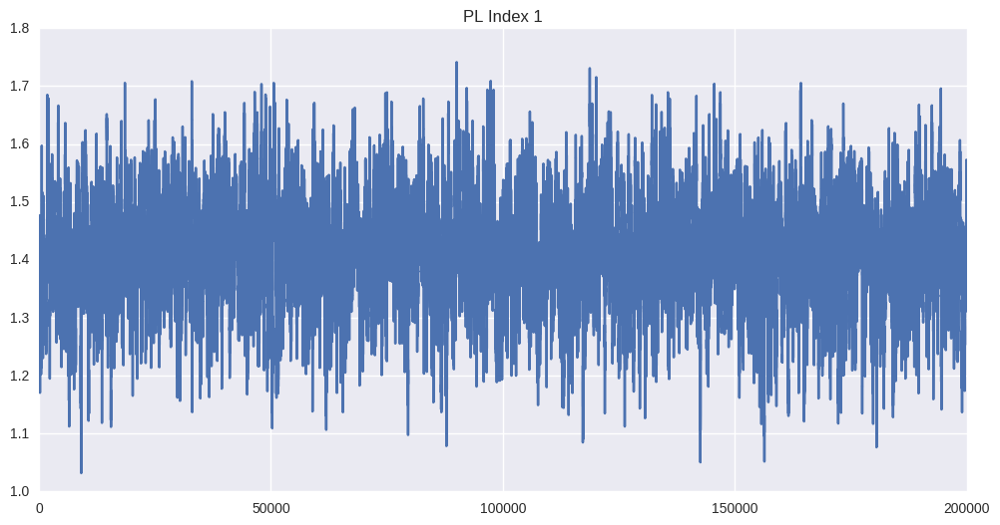

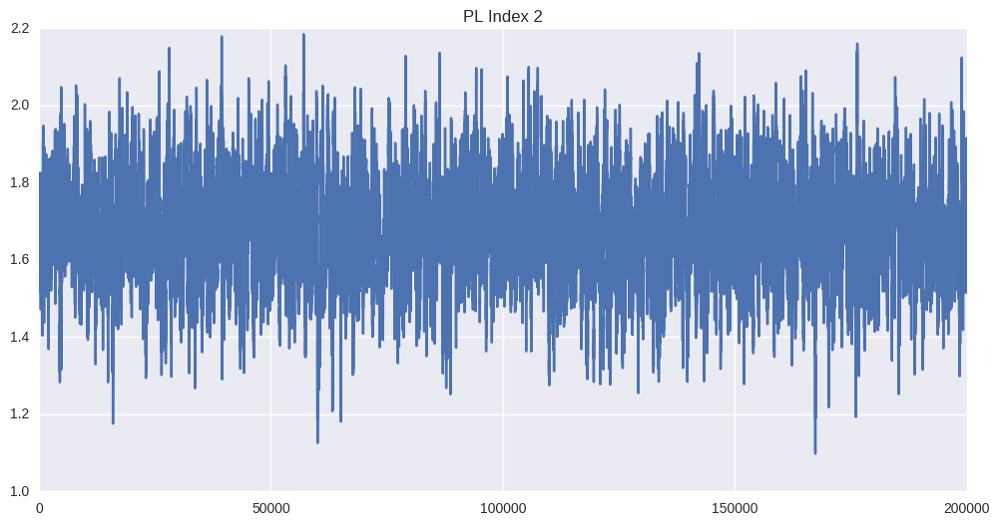

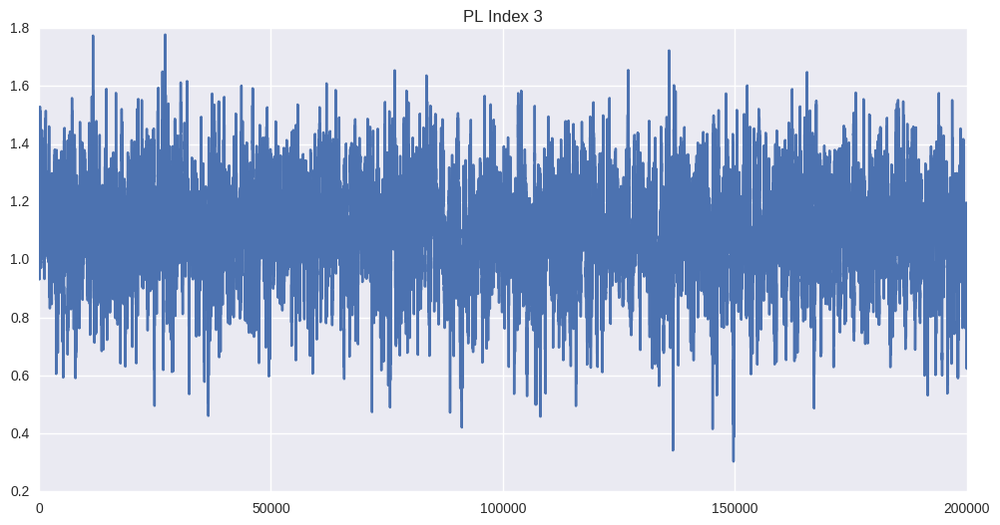

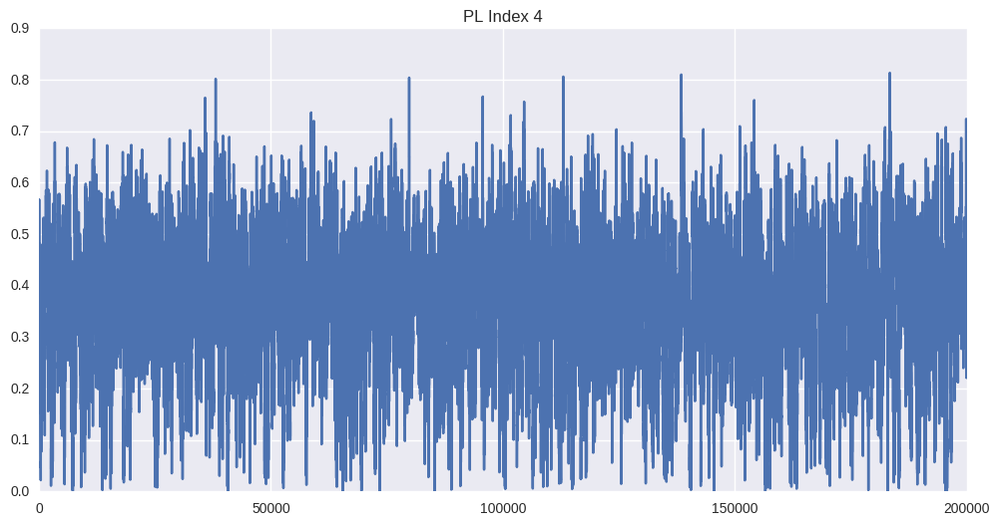

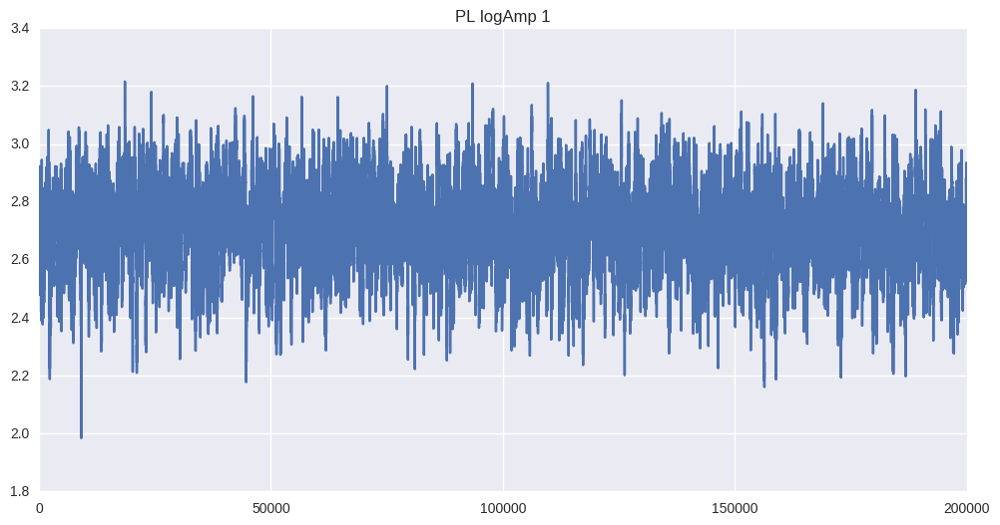

...

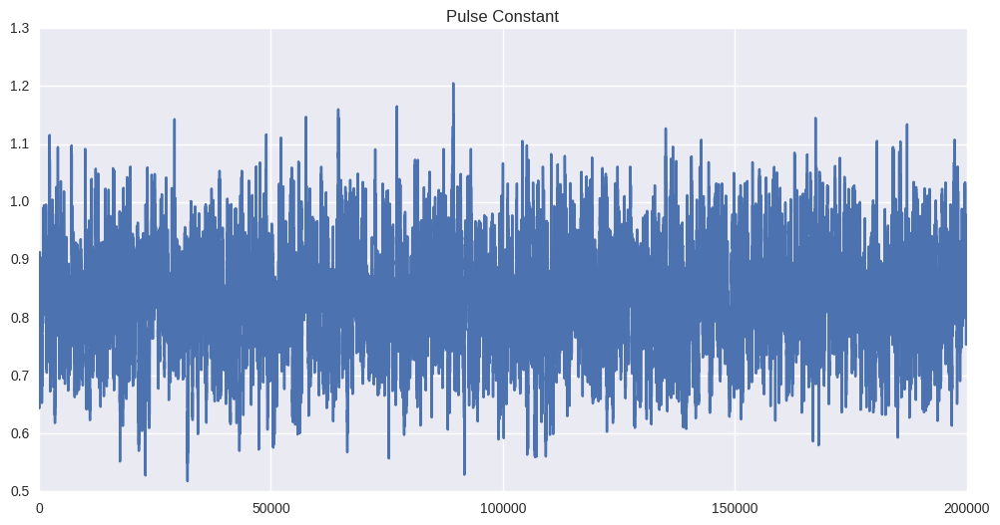

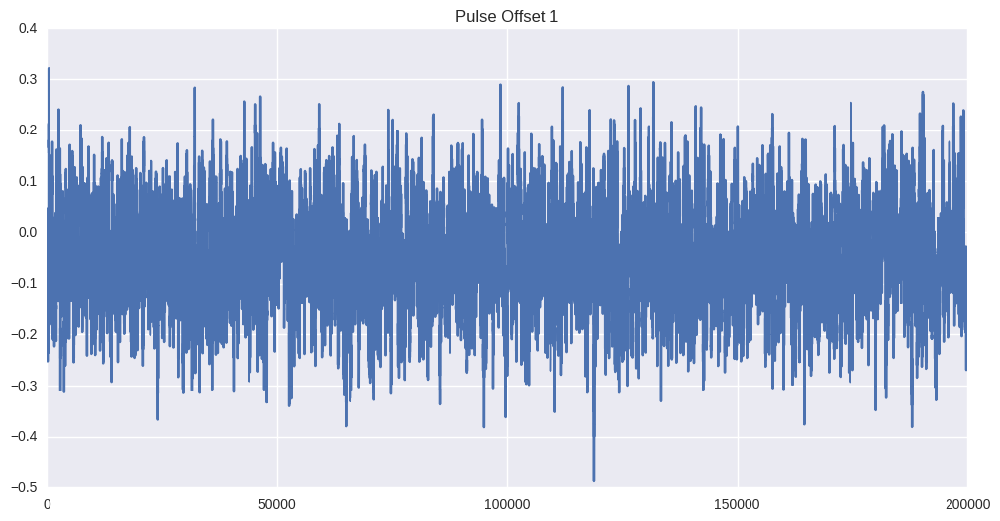

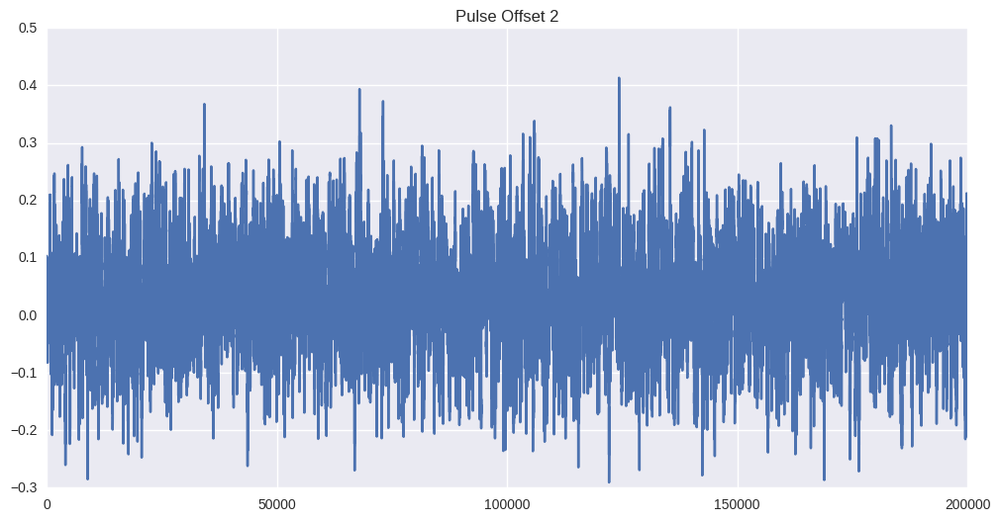

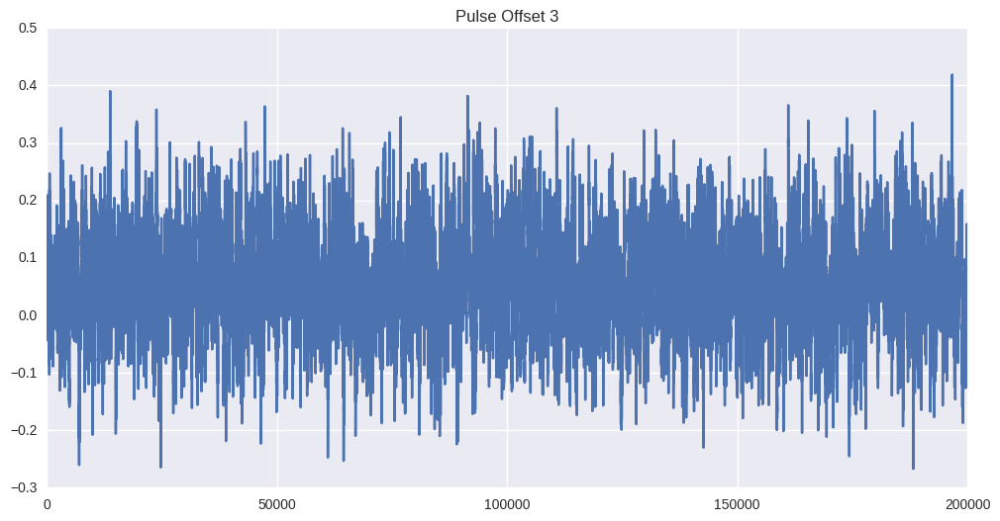

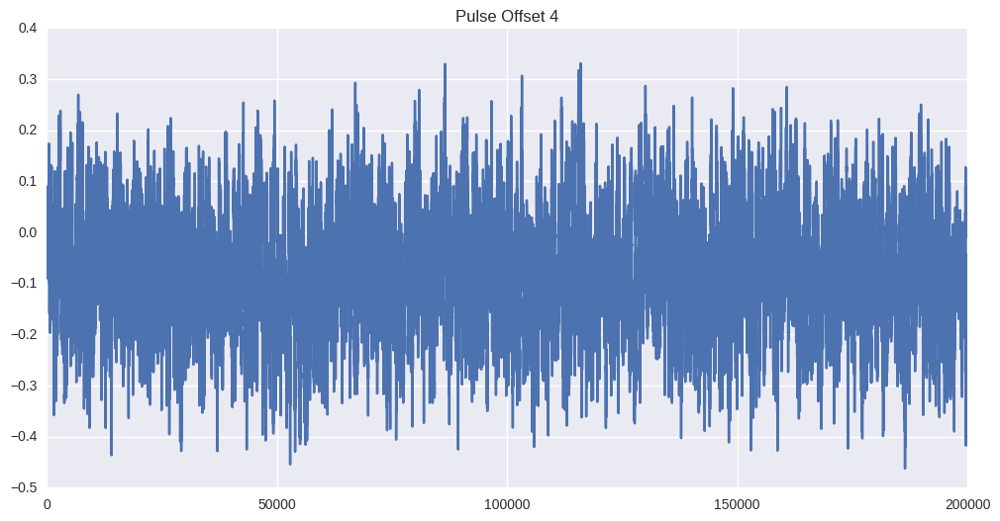

In [171]:
for i in range(sampler2.flatchain.shape[1]):
    fig, ax = plt.subplots(1,1,figsize=(12,6))
    ax.plot(sampler2.flatchain[:,i])
    ax.set_title(parnames[i])

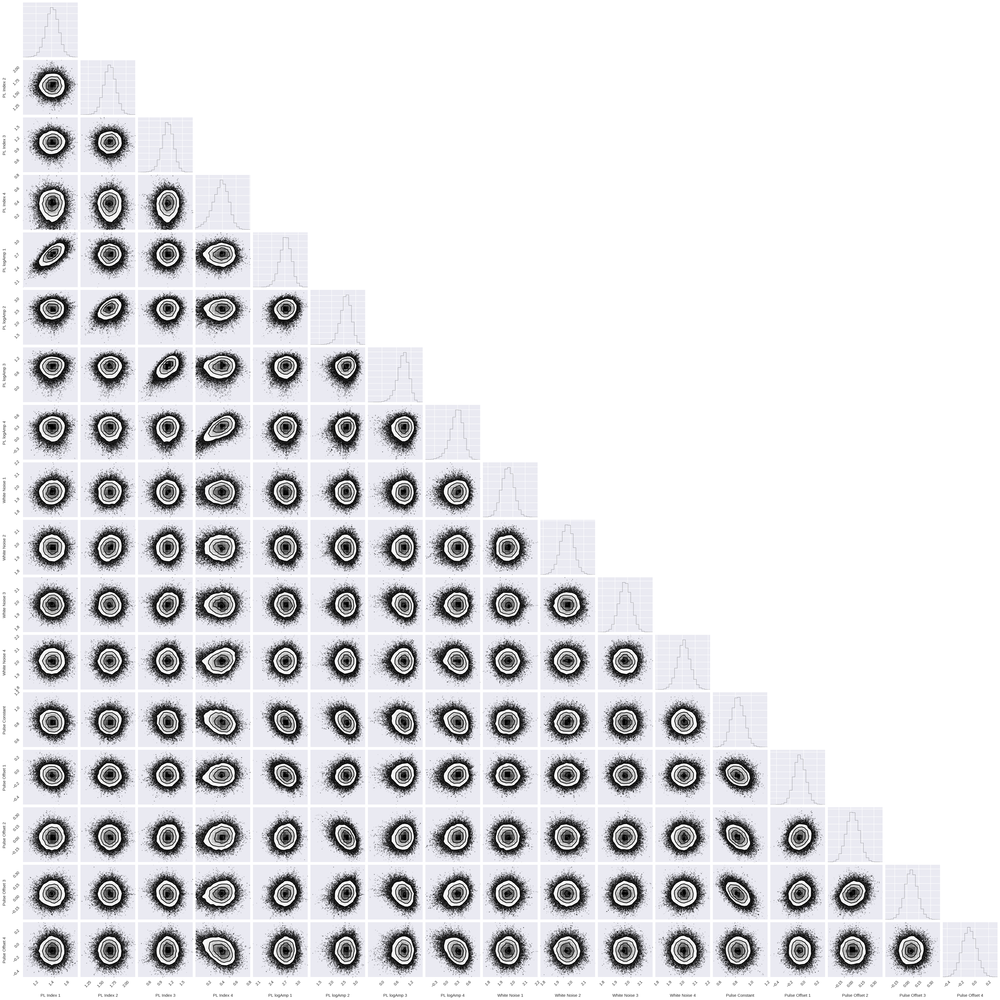

In [172]:
_ = corner.corner(sampler2.flatchain, labels=parnames)

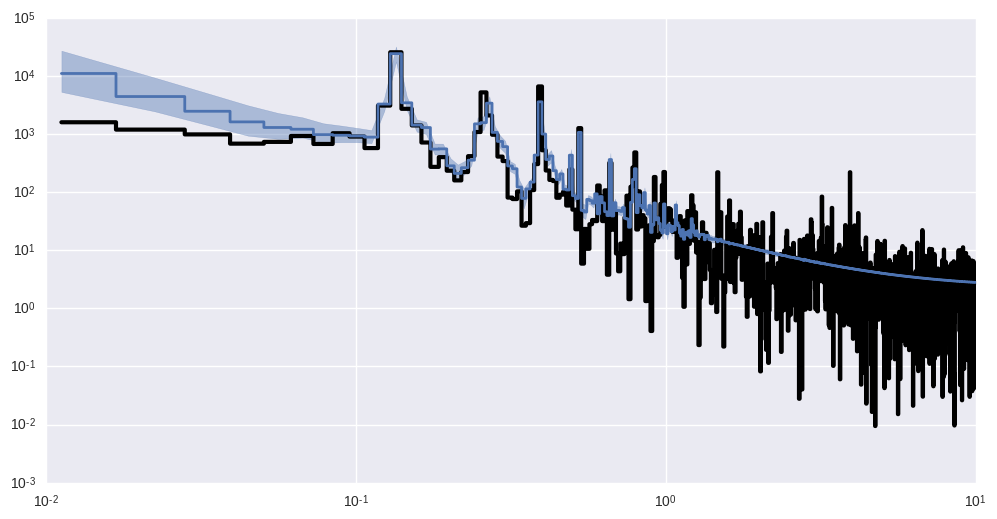

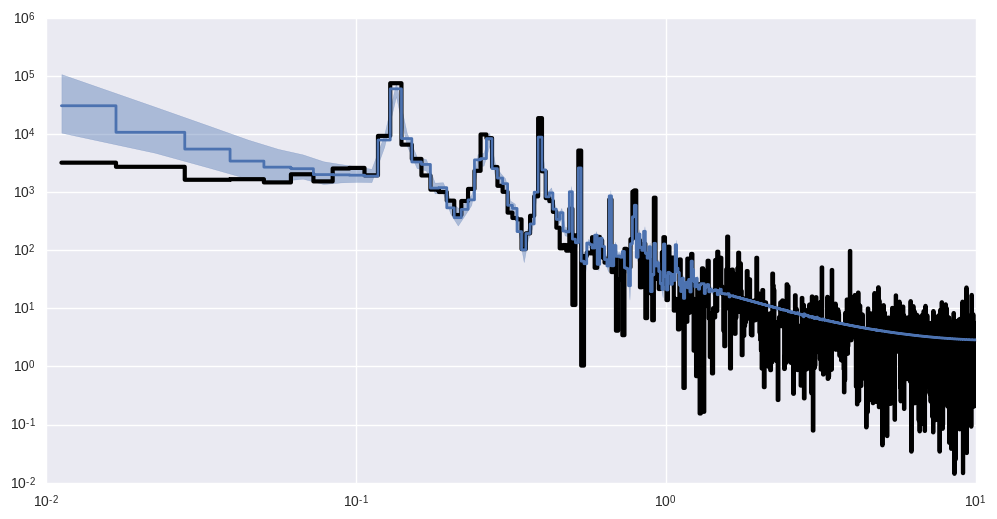

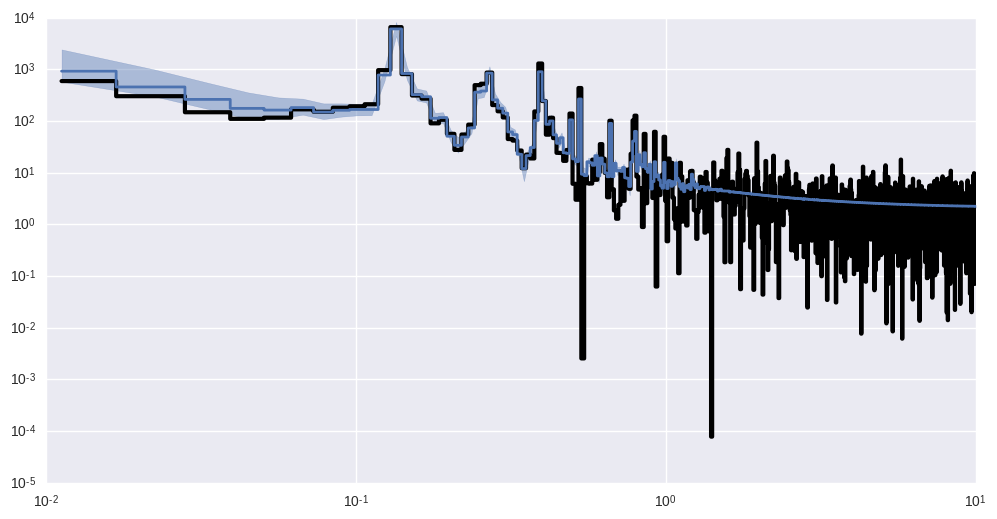

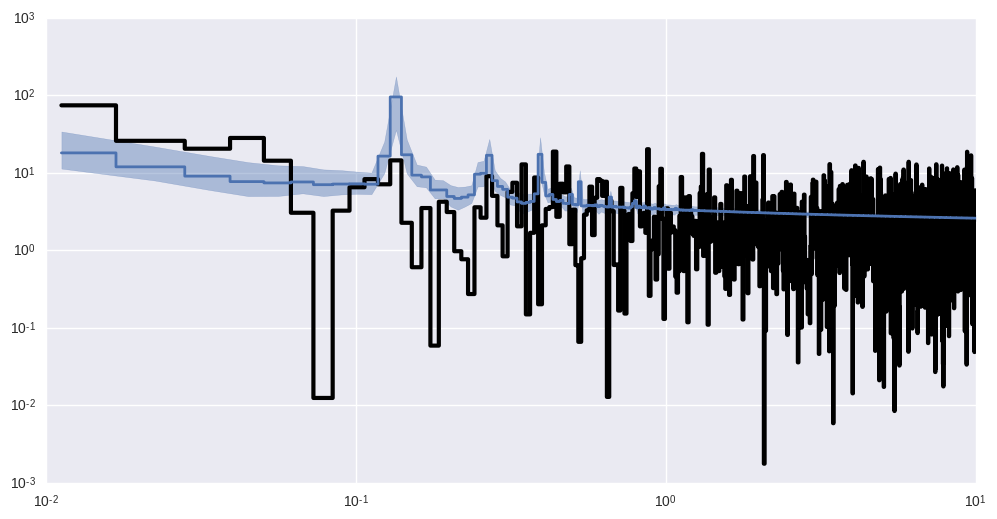

In [173]:
ps_sim_all2 = psd_examples(lc_all, lc_template, 1000, counts, bkg_counts, sampler2, lpost2)

lower_bound2, median2, upper_bound2 = compute_psd_bands(ps_sim_all2)

for i in range(npsd):
    ps = ps_short[i]
    lb = lower_bound2[i]
    med = median2[i]
    ub = upper_bound2[i]
    plt.figure(figsize=(12,6))
    plt.loglog(ps.freq, ps.power, linestyle="steps-mid", color="black", lw=3)
    plt.loglog(ps.freq, med, linestyle="steps-mid", color=sns.color_palette()[0], lw=2)
    plt.fill_between(ps.freq, lb, ub, color=sns.color_palette()[0], alpha=0.4)
    

In [175]:
len(sampler2.flatchain)

200000

In [176]:
for i,s in enumerate(sampler2.flatchain.T):
    print("parameter %s: %.4f +/- %.4f"%(parnames[i], np.mean(s), np.std(s)))

parameter PL Index 1: 1.4103 +/- 0.0832
parameter PL Index 2: 1.6791 +/- 0.1188
parameter PL Index 3: 1.1048 +/- 0.1540
parameter PL Index 4: 0.3696 +/- 0.1192
parameter PL logAmp 1: 2.7157 +/- 0.1295
parameter PL logAmp 2: 2.5896 +/- 0.2267
parameter PL logAmp 3: 0.8694 +/- 0.2388
parameter PL logAmp 4: 0.2774 +/- 0.1690
parameter White Noise 1: 1.9604 +/- 0.0495
parameter White Noise 2: 1.9774 +/- 0.0487
parameter White Noise 3: 1.9828 +/- 0.0496
parameter White Noise 4: 2.0128 +/- 0.0502
parameter Pulse Constant: 0.8330 +/- 0.0789
parameter Pulse Offset 1: -0.0511 +/- 0.0850
parameter Pulse Offset 2: 0.0311 +/- 0.0831
parameter Pulse Offset 3: 0.0578 +/- 0.0797
parameter Pulse Offset 4: -0.0790 +/- 0.1026


## Compute the Savage-Dickey Density Ratio 

In the next step, we will compute the Savage-Dickey density ratio for the second model using the MCMC samples. 

We marginalize over all parameters but the four pulse amplitude offsets, then compute the kernel density estimate for the posterior sample, then compare that to the multivariate prior.

Let's start with the latter, because it is easier. Our prior for $a_i$ is just a multi-variate Gaussian over four dimensions with $mu_i = 0 \forall i$ and $\sigma_i = 0.2$. All off-diagonal elements of the covariance matrix are zero.

In [177]:
means = np.zeros(npsd)
cov = np.diag(np.zeros(npsd) + 0.2)

prior = scipy.stats.multivariate_normal(mean=means, cov=cov)

In [178]:
prior.pdf([0.0, 1.0, 0.0, 1.1])

0.0025240808358085918

Okay, so now we'll produce the multi-dimensional KDE of the sampler for the second model:

In [179]:
s = sampler2.flatchain

Integrating over all parameters but the amplitude offsets is as easy as getting rid of the extra dimensions.

In [180]:
s = s[:,-4:]

In [181]:
s.shape

(200000, 4)

We'll use the Kernel Density Estimator from scikit-learn:

In [182]:
from sklearn.neighbors.kde import KernelDensity

kde = KernelDensity(kernel='gaussian', bandwidth=0.2).fit(s)


In [184]:
logdensity = kde.score_samples(s[::500])

In [185]:
ssmall = s[::500]

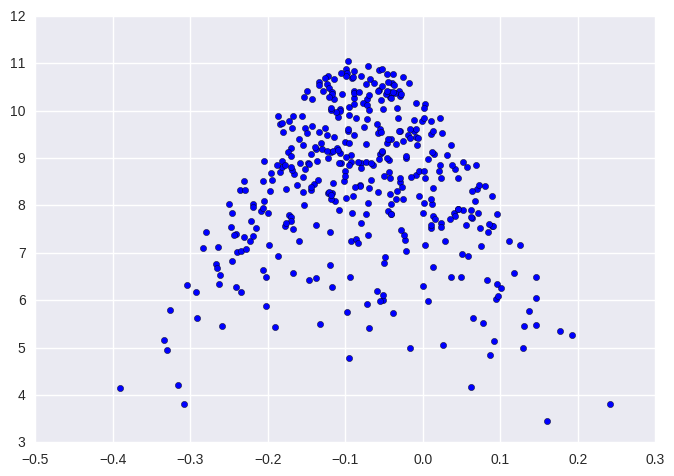

In [186]:
plt.scatter(ssmall[:,3], np.exp(logdensity))

In [187]:
logdensity_zero = kde.score_samples([0, 0, 0, 0])

/scratch/daniela/sw/miniconda/envs/py3/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


In [188]:
logdensity_zero

array([ 2.2701171])

In [189]:
prior_zero = prior.pdf([0,0,0,0])

In [190]:
prior_zero

0.6332573977646111

In [191]:
log_bayes_factor12 = np.log(np.exp(logdensity_zero)/prior_zero)

In [192]:
log_bayes_factor12

array([ 2.72699541])

In [196]:
1.-1/np.exp(log_bayes_factor12)

array([ 0.93458446])

That looks a bit better! It implies moderate evidence for the simpler model, i.e. a constant pulse amplitude.